In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

import json

from sklearn.neighbors import KNeighborsClassifier
from sklearn import svm
from sklearn.model_selection import train_test_split, KFold, cross_val_score, GridSearchCV
from sklearn.metrics import accuracy_score, classification_report, f1_score
from sklearn.feature_selection import SelectPercentile, chi2
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

get some basic info of data files

In [2]:
# ValueError: could not convert string to float: '8789-0'
def read_data_partial(given_fname, output_fname, lim=20000):
    content = []
    count = 1

    with open(given_fname, 'r') as fr:
        for line in fr:
            if count <= lim:
                #print(type(line), line)
                content.append(line)
                count += 1
    with open(output_fname, 'w') as fw:
        for line in content:
            # print(type(line), line)
            fw.write(line)
    
    data = pd.read_csv(output_fname, index_col=False)

    return data

In [3]:
qso_train_partial = read_data_partial('quasar_train_catalog.csv', 'qso_train_partial.csv')
print('qso_train_catalog.csv partial data description: ')
qso_train_partial.describe()

qso_train_catalog.csv partial data description: 


,ra_d,dec_d,z,u_LSST_mag,u_LSST_magerr,g_LSST_mag,g_LSST_magerr,r_LSST_mag,r_LSST_magerr,i_LSST_mag,...,y_LSST_mag,y_LSST_magerr,Y_WFI_mag,Y_WFI_magerr,J_WFI_mag,J_WFI_magerr,H_WFI_mag,H_WFI_magerr,F_WFI_mag,F_WFI_magerr
count,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,...,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000
mean,23.623792,-22.262561,7.999811,99.164311,0.091043,98.638451,0.205693,83.708411,0.652219,56.014640,...,38.686915,3.220267,22.667320,0.422618,18.249912,0.010070,17.991365,0.010060,17.924648,0.010103
std,13.673958,13.470843,1.154848,7.623070,3.252917,9.636021,9.258799,30.350312,27.306826,36.410617,...,31.606316,187.985892,10.687478,10.845862,0.144553,0.000095,0.344047,0.000094,0.354783,0.000099
min,0.001002,-47.495711,6.000196,26.765039,0.000000,27.911082,0.000000,22.470212,0.000000,20.720397,...,17.907592,0.000000,17.958488,0.000000,17.975591,0.009674,16.702080,0.009707,16.475177,0.009701
25%,11.645229,-33.527219,6.999971,99.990000,0.000000,99.990000,0.000000,99.990000,0.000000,25.028411,...,18.943982,0.010414,18.566404,0.010093,18.124439,0.010005,17.823141,0.009996,17.735487,0.010036
50%,23.594917,-21.578934,7.999920,99.990000,0.000000,99.990000,0.000000,99.990000,0.000000,29.389093,...,25.259249,0.011343,19.349044,0.010231,18.251091,0.010069,18.066165,0.010060,17.993070,0.010102
75%,35.422686,-10.572103,8.999614,99.990000,0.000000,99.990000,0.000000,99.990000,0.000000,99.990000,...,28.266166,0.560991,24.374057,0.018531,18.374454,0.010133,18.243405,0.010124,18.180132,0.010169
max,47.497256,-0.000376,9.999744,99.990000,285.052158,99.990000,878.110221,99.990000,2836.799364,99.990000,...,99.990000,26004.534629,99.990000,1291.885585,18.525293,0.010423,18.651787,0.010430,18.738388,0.010521


In [4]:
# brown dwarf contaminants
mlt_train_partial = read_data_partial('mlt_train_catalog.csv', 'mlt_train_partial.csv')
print('mlt_train_catalog.csv partial data description: ')
mlt_train_partial.describe()

mlt_train_catalog.csv partial data description: 


,ra_d,dec_d,spt,u_LSST_mag,u_LSST_magerr,g_LSST_mag,g_LSST_magerr,r_LSST_mag,r_LSST_magerr,i_LSST_mag,...,y_LSST_mag,y_LSST_magerr,Y_WFI_mag,Y_WFI_magerr,J_WFI_mag,J_WFI_magerr,H_WFI_mag,H_WFI_magerr,F_WFI_mag,F_WFI_magerr
count,19999.000000,19999.000000,19999.000000,1.999900e+04,19999.0,1.999900e+04,19999.0,19999.000000,19999.000000,19999.000000,...,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000
mean,23.604072,-22.261228,4.936797,9.999000e+01,0.0,9.999000e+01,0.0,24.416302,0.020199,19.872187,...,18.550723,0.010603,18.398234,0.010083,18.146058,0.010062,18.037319,0.010061,18.142713,0.010119
std,13.705803,13.505142,0.251022,8.540937e-12,0.0,8.540937e-12,0.0,0.182280,0.001938,0.142525,...,0.140613,0.000146,0.141465,0.000094,0.143001,0.000094,0.144039,0.000095,0.141402,0.000096
min,0.001930,-47.499684,3.000000,9.999000e+01,0.0,9.999000e+01,0.0,23.472924,0.013136,19.108723,...,18.098625,0.010041,17.893173,0.009737,17.674221,0.009702,17.560797,0.009668,17.670703,0.009760
25%,11.705409,-33.465227,5.000000,9.999000e+01,0.0,9.999000e+01,0.0,24.334772,0.018985,19.777932,...,18.454311,0.010503,18.301993,0.010020,18.049020,0.009998,17.939912,0.009996,18.046667,0.010054
50%,23.631542,-21.691304,5.000000,9.999000e+01,0.0,9.999000e+01,0.0,24.433813,0.020168,19.871827,...,18.547176,0.010598,18.393954,0.010082,18.140592,0.010061,18.031482,0.010060,18.136810,0.010118
75%,35.444491,-10.547422,5.000000,9.999000e+01,0.0,9.999000e+01,0.0,24.530030,0.021422,19.966675,...,18.643236,0.010697,18.487967,0.010146,18.235301,0.010125,18.127651,0.010124,18.234207,0.010184
max,47.487130,-0.000214,5.000000,9.999000e+01,0.0,9.999000e+01,0.0,25.108104,0.028811,20.899200,...,19.597340,0.011930,19.603275,0.010474,19.237794,0.010491,19.127854,0.010468,19.231066,0.010537


In [5]:
galaxies_patch8789_partial = read_data_partial('galaxies_train_catalog_patch8789.csv', 'galaxies_patch8789_partial.csv')
print('galaxies_train_catalog_patch8789.csv partial data description: ')
galaxies_patch8789_partial.describe()

galaxies_train_catalog_patch8789.csv partial data description: 


,ra_d,dec_d,z,redsq_flag,u_LSST_mag,u_LSST_magerr,g_LSST_mag,g_LSST_magerr,r_LSST_mag,r_LSST_magerr,...,z_LSST_mag,z_LSST_magerr,Y_WFI_mag,Y_WFI_magerr,J_WFI_mag,J_WFI_magerr,H_WFI_mag,H_WFI_magerr,F_WFI_mag,F_WFI_magerr
count,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,...,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000
mean,23.878705,-22.182163,1.029736,0.206060,32.096210,0.841619,27.163475,0.365798,25.867251,0.086984,...,24.665585,0.103122,24.393170,0.047201,24.257111,0.041552,24.143105,0.041009,24.097952,0.068160
std,13.681795,13.538485,0.013707,0.404484,19.985380,8.052372,7.995741,11.988124,2.446110,0.273719,...,2.360016,0.326791,1.390669,0.077989,1.525714,0.041961,1.372470,0.040619,1.855994,0.311219
min,0.000400,-47.490719,1.005989,0.000000,20.885667,0.000000,21.017643,0.000000,21.061000,0.000000,...,20.251427,0.000000,19.714550,0.000000,19.313884,0.000000,18.971237,0.010012,18.749711,0.000000
25%,12.078150,-33.422642,1.018022,0.000000,25.268505,0.060758,25.333199,0.036689,24.983450,0.026726,...,23.871939,0.034156,23.650510,0.020292,23.493042,0.018506,23.372548,0.017841,23.296980,0.023390
50%,23.957857,-21.268991,1.030270,0.000000,26.503441,0.193694,26.418137,0.082988,25.941315,0.050624,...,24.740292,0.063615,24.545892,0.033595,24.424274,0.030043,24.329182,0.029424,24.277466,0.043752
75%,35.765324,-10.507017,1.040617,0.000000,27.615922,0.475728,27.355587,0.181539,26.707190,0.092916,...,25.467804,0.115342,25.283910,0.056736,25.188414,0.050689,25.119557,0.050084,25.074150,0.080108
max,47.499362,-0.001712,1.055213,1.000000,99.990000,610.729321,99.990000,1616.793763,99.990000,27.122388,...,99.990000,24.843754,99.990000,8.171002,99.990000,1.879305,28.627669,1.148440,99.990000,40.846061


In [6]:
galaxies_patch8786_partial = read_data_partial('galaxies_train_catalog_patch8786.csv', 'galaxies_patch8786_partial.csv')
print('galaxies_train_catalog_patch8786.csv partial data description: ')
galaxies_patch8786_partial.describe()

galaxies_train_catalog_patch8786.csv partial data description: 


,ra_d,dec_d,z,redsq_flag,u_LSST_mag,u_LSST_magerr,g_LSST_mag,g_LSST_magerr,r_LSST_mag,r_LSST_magerr,...,y_LSST_mag,y_LSST_magerr,Y_WFI_mag,Y_WFI_magerr,J_WFI_mag,J_WFI_magerr,H_WFI_mag,H_WFI_magerr,F_WFI_mag,F_WFI_magerr
count,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,...,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000
mean,23.861391,-22.220777,1.033303,0.207710,32.076440,0.902327,27.211979,0.380718,25.851356,0.088822,...,25.221141,0.399308,24.361144,0.046372,24.219740,0.041185,24.111885,0.040571,24.051143,0.065607
std,13.730388,13.446906,0.013441,0.405678,19.986324,8.611686,8.326998,11.659733,2.517689,0.307329,...,7.801614,7.439558,1.312732,0.045483,1.353944,0.037782,1.402496,0.038762,1.544440,0.090881
min,0.000071,-47.499394,1.005990,0.000000,20.511595,0.000000,20.689145,0.000000,20.749999,0.000000,...,19.776906,0.000000,19.571055,0.010152,19.165246,0.010151,18.841577,0.010053,18.619593,0.000000
25%,11.862930,-33.452881,1.023309,0.000000,25.265173,0.057836,25.334869,0.036408,24.961529,0.026510,...,23.664300,0.072782,23.602897,0.019855,23.443356,0.018111,23.313647,0.017441,23.232343,0.022583
50%,23.977822,-21.484245,1.033333,0.000000,26.509003,0.197169,26.402710,0.082021,25.929260,0.050329,...,24.574696,0.157360,24.531609,0.033312,24.416682,0.029878,24.321447,0.029093,24.272070,0.043334
75%,35.794271,-10.561793,1.045235,0.000000,27.604059,0.477124,27.339770,0.178356,26.703131,0.092701,...,25.323580,0.305534,25.281628,0.056255,25.179444,0.050102,25.107016,0.049410,25.066376,0.079415
max,47.496472,-0.001413,1.055212,1.000000,99.990000,605.642904,99.990000,1492.010952,99.990000,30.285473,...,99.990000,979.763106,29.062647,1.628481,28.248498,0.767126,28.574002,1.177792,99.990000,5.245063


## drop u and g bands

In [7]:
qso_train_drop = qso_train_partial.copy(deep=True)
mlt_train_drop = mlt_train_partial.copy(deep=True)
galaxies_patch8789_drop = galaxies_patch8789_partial.copy(deep=True)
galaxies_patch8786_drop = galaxies_patch8786_partial.copy(deep=True)

# drop y bands due to varying band depth
qso_train_drop = qso_train_drop[['r_LSST_mag', 'i_LSST_mag', 'z_LSST_mag', 'Y_WFI_mag', 'J_WFI_mag', 'H_WFI_mag', 'F_WFI_mag']]
mlt_train_drop = mlt_train_drop[['r_LSST_mag', 'i_LSST_mag', 'z_LSST_mag','Y_WFI_mag', 'J_WFI_mag', 'H_WFI_mag', 'F_WFI_mag']]
galaxies_patch8789_drop = galaxies_patch8789_drop[['r_LSST_mag', 'i_LSST_mag', 'z_LSST_mag', 'Y_WFI_mag', 'J_WFI_mag', 'H_WFI_mag', 'F_WFI_mag']]
galaxies_patch8786_drop = galaxies_patch8786_drop[['r_LSST_mag', 'i_LSST_mag', 'z_LSST_mag','Y_WFI_mag', 'J_WFI_mag', 'H_WFI_mag', 'F_WFI_mag']]

In [8]:
print(mlt_train_drop.head())

   r_LSST_mag  i_LSST_mag  z_LSST_mag  Y_WFI_mag  J_WFI_mag  H_WFI_mag  \
0   23.771728   19.188742   18.619318  18.234199  18.173076  18.075345   
1   24.057291   19.349954   18.518527  18.288840  18.190218  17.931068   
2   23.800163   19.231461   18.658050  18.124577  18.069681  18.094448   
3   23.875277   19.292420   18.613907  18.302484  18.055089  17.946084   
4   23.916246   19.295319   18.665239  18.207935  18.128765  18.094981   

   F_WFI_mag  
0  18.112094  
1  18.153265  
2  17.930868  
3  17.947154  
4  18.246019  


### drop missing values

In [9]:
qso_train_drop = qso_train_drop.replace(99.99, np.nan).dropna()
mlt_train_drop = mlt_train_drop.replace(99.99, np.nan).dropna()
galaxies_patch8789_drop = galaxies_patch8789_drop.replace(99.99, np.nan).dropna()
galaxies_patch8786_drop = galaxies_patch8786_drop.replace(99.99, np.nan).dropna()

print(qso_train_drop.head(), len(qso_train_drop))
print(np.where(np.isnan(qso_train_drop)))
print(len(mlt_train_drop))
print(np.where(np.isnan(mlt_train_drop)))
print(len(galaxies_patch8789_drop))
print(np.where(np.isnan(galaxies_patch8789_drop)))
print(len(galaxies_patch8786_drop))
print(np.where(np.isnan(galaxies_patch8786_drop)))

   r_LSST_mag  i_LSST_mag  z_LSST_mag  Y_WFI_mag  J_WFI_mag  H_WFI_mag  \
0   23.264536   21.124055   18.554360  18.128561  18.023118  17.887595   
1   22.749456   20.809598   18.341480  18.051626  18.089177  18.128696   
2   23.423308   21.433489   18.603074  18.187806  18.020838  17.793332   
3   23.340448   21.204065   18.452523  18.136504  18.066659  17.968268   
4   23.158449   20.894110   18.271392  18.043841  18.061578  18.047223   

   F_WFI_mag  
0  17.631285  
1  18.004063  
2  17.472947  
3  17.731981  
4  17.902222   4402
(array([], dtype=int64), array([], dtype=int64))
19999
(array([], dtype=int64), array([], dtype=int64))
19958
(array([], dtype=int64), array([], dtype=int64))
19961
(array([], dtype=int64), array([], dtype=int64))


In [10]:
qso_train_drop['label'] = np.ones(len(qso_train_drop))
mlt_train_drop['label'] = np.zeros(len(mlt_train_drop))
galaxies_patch8789_drop['label'] = np.zeros(len(galaxies_patch8789_drop))
galaxies_patch8786_drop['label'] = np.zeros(len(galaxies_patch8786_drop))

### check the cleaned datasets and concatenate into new ones

In [11]:
print('qso:\n', qso_train_drop.head())
print('bd:\n', mlt_train_drop.head())
print('galaxies patch8789:\n', galaxies_patch8789_drop.head())
print('galaxies path8786:\n', galaxies_patch8786_drop.head())

qso:
    r_LSST_mag  i_LSST_mag  z_LSST_mag  Y_WFI_mag  J_WFI_mag  H_WFI_mag  \
0   23.264536   21.124055   18.554360  18.128561  18.023118  17.887595   
1   22.749456   20.809598   18.341480  18.051626  18.089177  18.128696   
2   23.423308   21.433489   18.603074  18.187806  18.020838  17.793332   
3   23.340448   21.204065   18.452523  18.136504  18.066659  17.968268   
4   23.158449   20.894110   18.271392  18.043841  18.061578  18.047223   

   F_WFI_mag  label  
0  17.631285    1.0  
1  18.004063    1.0  
2  17.472947    1.0  
3  17.731981    1.0  
4  17.902222    1.0  
bd:
    r_LSST_mag  i_LSST_mag  z_LSST_mag  Y_WFI_mag  J_WFI_mag  H_WFI_mag  \
0   23.771728   19.188742   18.619318  18.234199  18.173076  18.075345   
1   24.057291   19.349954   18.518527  18.288840  18.190218  17.931068   
2   23.800163   19.231461   18.658050  18.124577  18.069681  18.094448   
3   23.875277   19.292420   18.613907  18.302484  18.055089  17.946084   
4   23.916246   19.295319   18.665239  18.

In [12]:
# data concatenation to get training data
contaminants_drop = pd.concat([mlt_train_drop, galaxies_patch8789_drop, galaxies_patch8786_drop], ignore_index=True)
data_train_drop = pd.concat([qso_train_drop, contaminants_drop], ignore_index=True) # make sure that the data line up
X_drop = data_train_drop[['r_LSST_mag', 'i_LSST_mag', 'z_LSST_mag','Y_WFI_mag', 'J_WFI_mag', 'H_WFI_mag', 'F_WFI_mag']]
Y_drop = data_train_drop['label']

In [13]:
print(len(X_drop))

64320


### check some influential combinations of color indices - linear svc

without i-band limits:

keep_added_cols = ['J_WFI_mag-H_WFI_mag', 'r_LSST_mag-i_LSST_mag', 'Y_WFI_mag-H_WFI_mag', 'z_LSST_mag-H_WFI_mag', 'i_LSST_mag-z_LSST_mag', 'i_LSST_mag-Y_WFI_mag', 'i_LSST_mag-J_WFI_mag', 'i_LSST_mag-F_WFI_mag']

### dropping replacement values

i < 22

In [14]:
X_drop_small = X_drop[X_drop['i_LSST_mag'] < 22.0]
Y_drop_small = data_train_drop[data_train_drop['i_LSST_mag'] < 22.0]
Y_drop_small = Y_drop_small['label']
col_names = ['r_LSST_mag', 'i_LSST_mag', 'z_LSST_mag', 'Y_WFI_mag', 'J_WFI_mag', 'H_WFI_mag', 'F_WFI_mag']
for i in range(len(col_names)):
    for j in range(len(col_names)):
        if i < j:
            col = col_names[i] + '-' + col_names[j]
            X_drop_small[col] = X_drop_small[col_names[i]] - X_drop_small[col_names[j]]

X_drop_small_copy = X_drop_small.drop(columns=['r_LSST_mag', 'i_LSST_mag', 'z_LSST_mag', 'Y_WFI_mag', 'J_WFI_mag', 'H_WFI_mag', 'F_WFI_mag'])

<ipython-input-14-5aaefde74110>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_drop_small[col] = X_drop_small[col_names[i]] - X_drop_small[col_names[j]]


In [15]:
X_drop_small_copy.describe()

,r_LSST_mag-i_LSST_mag,r_LSST_mag-z_LSST_mag,r_LSST_mag-Y_WFI_mag,r_LSST_mag-J_WFI_mag,r_LSST_mag-H_WFI_mag,r_LSST_mag-F_WFI_mag,i_LSST_mag-z_LSST_mag,i_LSST_mag-Y_WFI_mag,i_LSST_mag-J_WFI_mag,i_LSST_mag-H_WFI_mag,...,z_LSST_mag-Y_WFI_mag,z_LSST_mag-J_WFI_mag,z_LSST_mag-H_WFI_mag,z_LSST_mag-F_WFI_mag,Y_WFI_mag-J_WFI_mag,Y_WFI_mag-H_WFI_mag,Y_WFI_mag-F_WFI_mag,J_WFI_mag-H_WFI_mag,J_WFI_mag-F_WFI_mag,H_WFI_mag-F_WFI_mag
count,22196.000000,22196.000000,22196.000000,22196.000000,22196.000000,22196.000000,22196.000000,22196.000000,22196.000000,22196.000000,...,22196.000000,22196.000000,22196.000000,22196.000000,22196.000000,22196.000000,22196.000000,22196.000000,22196.000000,22196.000000
mean,4.334200,5.316050,5.930809,6.168171,6.273850,6.196149,0.981850,1.596609,1.833970,1.939650,...,0.614759,0.852120,0.957800,0.880099,0.237361,0.343041,0.265340,0.105679,0.027978,-0.077701
std,0.770219,0.719092,0.795816,0.799996,0.786787,0.757258,0.488013,0.519841,0.479754,0.462790,...,0.176398,0.184073,0.185854,0.175766,0.145053,0.156193,0.152858,0.139637,0.159506,0.160030
min,0.104459,0.456312,0.589084,0.739814,0.889692,1.005677,0.205184,0.425360,0.559003,0.678496,...,0.011235,0.007713,-0.055985,0.032841,-0.344826,-0.289929,-0.343611,-0.431800,-0.569080,-0.662826
25%,4.401334,5.292115,5.912974,6.165437,6.272333,6.172384,0.761522,1.377619,1.630589,1.738808,...,0.508270,0.747945,0.855439,0.771184,0.133208,0.242749,0.162591,0.011591,-0.081920,-0.189863
50%,4.536381,5.412971,6.036553,6.289467,6.399253,6.293661,0.867642,1.486925,1.739738,1.849593,...,0.613330,0.863112,0.969083,0.878089,0.235811,0.349868,0.261789,0.104530,0.021276,-0.084494
75%,4.648818,5.522246,6.148488,6.398824,6.508697,6.405654,0.982145,1.602046,1.856104,1.966448,...,0.717066,0.966476,1.072594,0.980393,0.336892,0.449612,0.363754,0.199875,0.129503,0.030830
max,6.599588,8.151501,10.425592,10.527762,10.513148,10.629177,3.324206,3.890358,3.987116,4.065484,...,2.320453,2.457017,2.500517,2.654288,0.828828,1.006410,0.988484,0.675549,0.640979,0.396113


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


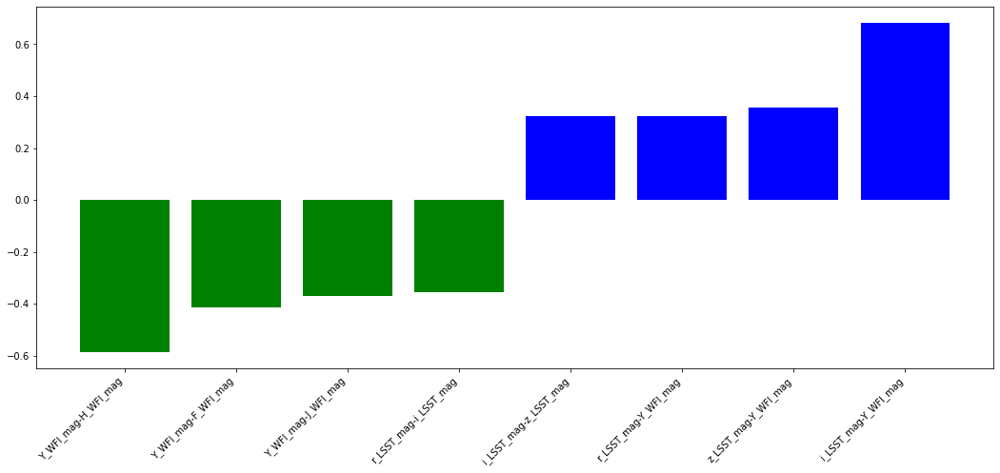

In [16]:
trainedsvm = svm.LinearSVC(max_iter = 2000).fit(X_drop_small_copy, Y_drop_small)
coef = trainedsvm.coef_.ravel()

top_positive_coefficients = np.argsort(coef)[-4:]
top_negative_coefficients = np.argsort(coef)[:4]
top_coefficients = np.hstack([top_negative_coefficients, top_positive_coefficients])
plt.figure(figsize=(18, 7))
colors = ['green' if c < 0 else 'blue' for c in coef[top_coefficients]]
plt.bar(np.arange(2 * 4), coef[top_coefficients], color=colors)
feature_names = np.array(X_drop_small_copy.columns)
plt.xticks(np.arange(2 * 4), feature_names[top_coefficients], rotation=45, ha='right')
plt.show()

i < 21.0 : 'z_LSST_mag-H_WFI_mag', 'z_LSST_mag-F_WFI_mag', 'z_LSST_mag-J_WFI_mag', 'r_LSST_mag-i_LSST_mag', 'i_LSST_mag-J_WFI_mag', 'r_LSST_mag-z_LSST_mag', 'i_LSST_mag-Y_WFI_mag', 'i_LSST_mag-z_LSST_mag'

In [17]:
# keep the columns with the highest influences & check if the dataframes look reasonable
# with i-band limits
X_drop_small = X_drop_small[['r_LSST_mag', 'i_LSST_mag', 'z_LSST_mag', 'Y_WFI_mag', 'J_WFI_mag', 'H_WFI_mag', 'F_WFI_mag', 'Y_WFI_mag-H_WFI_mag', 'Y_WFI_mag-F_WFI_mag', 'Y_WFI_mag-J_WFI_mag', 'r_LSST_mag-i_LSST_mag', 'i_LSST_mag-z_LSST_mag', 'r_LSST_mag-Y_WFI_mag', 'z_LSST_mag-Y_WFI_mag', 'i_LSST_mag-Y_WFI_mag']]

print(type(X_drop_small))
print('X with i < 22.0: \n', X_drop_small.head())

<class 'pandas.core.frame.DataFrame'>
X with i < 22.0: 
    r_LSST_mag  i_LSST_mag  z_LSST_mag  Y_WFI_mag  J_WFI_mag  H_WFI_mag  \
0   23.264536   21.124055   18.554360  18.128561  18.023118  17.887595   
1   22.749456   20.809598   18.341480  18.051626  18.089177  18.128696   
2   23.423308   21.433489   18.603074  18.187806  18.020838  17.793332   
3   23.340448   21.204065   18.452523  18.136504  18.066659  17.968268   
4   23.158449   20.894110   18.271392  18.043841  18.061578  18.047223   

   F_WFI_mag  Y_WFI_mag-H_WFI_mag  Y_WFI_mag-F_WFI_mag  Y_WFI_mag-J_WFI_mag  \
0  17.631285             0.240966             0.497276             0.105442   
1  18.004063            -0.077070             0.047562            -0.037551   
2  17.472947             0.394474             0.714859             0.166968   
3  17.731981             0.168236             0.404524             0.069845   
4  17.902222            -0.003382             0.141619            -0.017737   

   r_LSST_mag-i_LSST_ma

In [18]:
X_drop_small.describe()

,r_LSST_mag,i_LSST_mag,z_LSST_mag,Y_WFI_mag,J_WFI_mag,H_WFI_mag,F_WFI_mag,Y_WFI_mag-H_WFI_mag,Y_WFI_mag-F_WFI_mag,Y_WFI_mag-J_WFI_mag,r_LSST_mag-i_LSST_mag,i_LSST_mag-z_LSST_mag,r_LSST_mag-Y_WFI_mag,z_LSST_mag-Y_WFI_mag,i_LSST_mag-Y_WFI_mag
count,22196.000000,22196.000000,22196.000000,22196.000000,22196.000000,22196.000000,22196.000000,22196.000000,22196.000000,22196.000000,22196.000000,22196.000000,22196.000000,22196.000000,22196.000000
mean,24.378168,20.043968,19.062118,18.447359,18.209998,18.104318,18.182019,0.343041,0.265340,0.237361,4.334200,0.981850,5.930809,0.614759,1.596609
std,0.469171,0.542270,0.365025,0.403594,0.409190,0.399441,0.368368,0.156193,0.152858,0.145053,0.770219,0.488013,0.795816,0.176398,0.519841
min,20.749999,19.108723,18.073481,17.893173,17.674221,17.560797,17.412776,-0.289929,-0.343611,-0.344826,0.104459,0.205184,0.589084,0.011235,0.425360
25%,24.317394,19.789280,18.916067,18.295343,18.055718,17.949284,18.037940,0.242749,0.162591,0.133208,4.401334,0.761522,5.912974,0.508270,1.377619
50%,24.429883,19.891712,19.017391,18.392074,18.149194,18.044344,18.133562,0.349868,0.261789,0.235811,4.536381,0.867642,6.036553,0.613330,1.486925
75%,24.535301,20.006970,19.120047,18.491228,18.251450,18.149063,18.237229,0.449612,0.363754,0.336892,4.648818,0.982145,6.148488,0.717066,1.602046
max,28.527669,21.999023,21.683691,21.522254,21.402775,21.291406,21.173452,1.006410,0.988484,0.828828,6.599588,3.324206,10.425592,2.320453,3.890358


22 < i < 24

In [19]:
X_drop_between = X_drop[X_drop['i_LSST_mag'] < 24.0]
X_drop_between = X_drop_between[X_drop_between['i_LSST_mag'] > 22.0]
Y_drop_between = data_train_drop[data_train_drop['i_LSST_mag'] < 24.0]
Y_drop_between = Y_drop_between[Y_drop_between['i_LSST_mag'] > 22.0]['label']
col_names = ['r_LSST_mag', 'i_LSST_mag', 'z_LSST_mag', 'Y_WFI_mag', 'J_WFI_mag', 'H_WFI_mag', 'F_WFI_mag']
for i in range(len(col_names)):
    for j in range(len(col_names)):
        if i < j:
            col = col_names[i] + '-' + col_names[j]
            X_drop_between[col] = X_drop_between[col_names[i]] - X_drop_between[col_names[j]]

X_drop_between_copy = X_drop_between.drop(columns=['r_LSST_mag', 'i_LSST_mag', 'z_LSST_mag', 'Y_WFI_mag', 'J_WFI_mag', 'H_WFI_mag', 'F_WFI_mag'])

/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


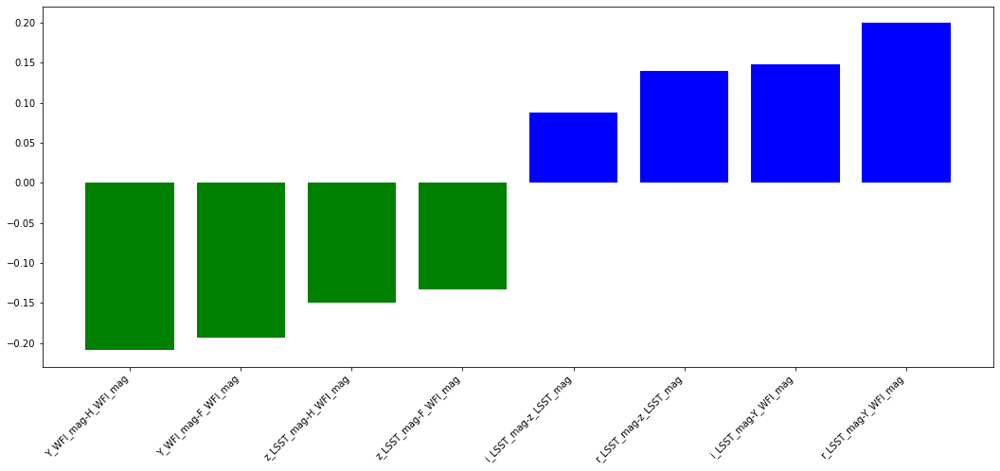

In [20]:
trainedsvm = svm.LinearSVC(max_iter = 2000).fit(X_drop_between_copy, Y_drop_between)
coef = trainedsvm.coef_.ravel()

top_positive_coefficients = np.argsort(coef)[-4:]
top_negative_coefficients = np.argsort(coef)[:4]
top_coefficients = np.hstack([top_negative_coefficients, top_positive_coefficients])
plt.figure(figsize=(18, 7))
colors = ['green' if c < 0 else 'blue' for c in coef[top_coefficients]]
plt.bar(np.arange(2 * 4), coef[top_coefficients], color=colors)
feature_names = np.array(X_drop_between_copy.columns)
plt.xticks(np.arange(2 * 4), feature_names[top_coefficients], rotation=45, ha='right')
plt.show()

21.0 < i < 24.0: 'Y_WFI_mag-H_WFI_mag', 'Y_WFI_mag-F_WFI_mag', 'z_LSST_mag-H_WFI_mag', 'z_LSST_mag-F_WFI_mag', 'r_LSST_mag-z_LSST_mag', 'i_LSST_mag-z_LSST_mag', 'i_LSST_mag-Y_WFI_mag', 'r_LSST_mag-Y_WFI_mag']

In [21]:
# keep the columns with the highest influences & check if the dataframes look reasonable
# with i-band limits
X_drop_between = X_drop_between[['r_LSST_mag', 'i_LSST_mag', 'z_LSST_mag', 'Y_WFI_mag', 'J_WFI_mag', 'H_WFI_mag', 'F_WFI_mag', 'Y_WFI_mag-H_WFI_mag', 'Y_WFI_mag-F_WFI_mag', 'z_LSST_mag-H_WFI_mag', 'z_LSST_mag-F_WFI_mag', 'r_LSST_mag-z_LSST_mag', 'i_LSST_mag-z_LSST_mag', 'i_LSST_mag-Y_WFI_mag', 'r_LSST_mag-Y_WFI_mag']]

print(type(X_drop_between))
print('X with 22.0 < i < 24.0: \n', X_drop_between.head())

<class 'pandas.core.frame.DataFrame'>
X with 22.0 < i < 24.0: 
      r_LSST_mag  i_LSST_mag  z_LSST_mag  Y_WFI_mag  J_WFI_mag  H_WFI_mag  \
250   24.742821   22.094462   18.874546  18.141918  18.092987  18.074826   
304   25.848806   22.030592   19.422444  18.264333  18.076935  17.984105   
306   25.643431   22.038840   19.404501  18.273683  18.043071  17.844302   
310   25.614387   22.020449   19.134073  18.132919  17.997342  17.920215   
313   25.498590   22.068718   19.220210  18.246276  18.091573  17.966831   

     F_WFI_mag  Y_WFI_mag-H_WFI_mag  Y_WFI_mag-F_WFI_mag  \
250  17.924192             0.067092             0.217726   
304  17.798655             0.280228             0.465679   
306  17.566675             0.429381             0.707008   
310  17.727046             0.212703             0.405873   
313  17.738691             0.279445             0.507585   

     z_LSST_mag-H_WFI_mag  z_LSST_mag-F_WFI_mag  r_LSST_mag-z_LSST_mag  \
250              0.799720              0.950

i > 24.0

In [22]:
X_drop_large = X_drop[X_drop['i_LSST_mag'] > 24.0]
Y_drop_large = data_train_drop[data_train_drop['i_LSST_mag'] > 24.0]['label']
col_names = ['r_LSST_mag', 'i_LSST_mag', 'z_LSST_mag', 'Y_WFI_mag', 'J_WFI_mag', 'H_WFI_mag', 'F_WFI_mag']
for i in range(len(col_names)):
    for j in range(len(col_names)):
        if i < j:
            col = col_names[i] + '-' + col_names[j]
            X_drop_large[col] = X_drop_large[col_names[i]] - X_drop_large[col_names[j]]

X_drop_large_copy = X_drop_large.drop(columns=['r_LSST_mag', 'i_LSST_mag', 'z_LSST_mag', 'Y_WFI_mag', 'J_WFI_mag', 'H_WFI_mag', 'F_WFI_mag'])

<ipython-input-22-120ff2d7b9d7>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_drop_large[col] = X_drop_large[col_names[i]] - X_drop_large[col_names[j]]


In [23]:
X_drop_large.describe()

,r_LSST_mag,i_LSST_mag,z_LSST_mag,Y_WFI_mag,J_WFI_mag,H_WFI_mag,F_WFI_mag,r_LSST_mag-i_LSST_mag,r_LSST_mag-z_LSST_mag,r_LSST_mag-Y_WFI_mag,...,z_LSST_mag-Y_WFI_mag,z_LSST_mag-J_WFI_mag,z_LSST_mag-H_WFI_mag,z_LSST_mag-F_WFI_mag,Y_WFI_mag-J_WFI_mag,Y_WFI_mag-H_WFI_mag,Y_WFI_mag-F_WFI_mag,J_WFI_mag-H_WFI_mag,J_WFI_mag-F_WFI_mag,H_WFI_mag-F_WFI_mag
count,33659.000000,33659.000000,33659.000000,33659.000000,33659.000000,33659.000000,33659.000000,33659.000000,33659.000000,33659.000000,...,33659.000000,33659.000000,33659.000000,33659.000000,33659.000000,33659.000000,33659.000000,33659.000000,33659.000000,33659.000000
mean,26.343533,25.650560,25.000196,24.678780,24.543247,24.450997,24.399433,0.692973,1.343338,1.664753,...,0.321415,0.456948,0.549198,0.600763,0.135533,0.227783,0.279348,0.092250,0.143815,0.051565
std,1.133356,0.933445,0.920237,1.260724,1.311566,1.332670,1.359843,0.655978,0.902911,1.580888,...,0.763010,0.844796,0.872946,0.899669,0.190888,0.250886,0.302035,0.118182,0.179142,0.130609
min,24.045651,24.000193,22.374511,18.175076,17.975591,17.184999,17.143052,-4.455939,-4.033506,-0.991792,...,-2.265067,-1.193701,-1.356980,-3.581173,-2.304482,-1.256236,-4.448935,-1.316960,-4.734080,-4.527911
25%,25.572649,24.967612,24.326616,24.116762,23.981235,23.869470,23.800110,0.440075,0.975059,1.094834,...,0.063508,0.118464,0.156428,0.175864,0.040374,0.079607,0.100714,0.023791,0.044692,0.000912
50%,26.233586,25.594436,24.953393,24.768166,24.652353,24.572184,24.520422,0.610726,1.228888,1.388807,...,0.177921,0.283871,0.359384,0.405282,0.117625,0.191700,0.238751,0.086711,0.135185,0.059262
75%,26.934030,26.230725,25.603927,25.408680,25.312189,25.244340,25.206649,0.816828,1.557339,1.892580,...,0.370044,0.584328,0.748846,0.842765,0.228601,0.382058,0.470567,0.166938,0.255344,0.116616
max,37.997592,33.782180,32.209823,29.263699,29.527499,28.627669,31.803707,13.014238,15.072606,19.725569,...,12.662344,13.708760,13.812275,13.820853,10.797291,11.955603,12.071539,1.973826,1.492225,1.649058


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


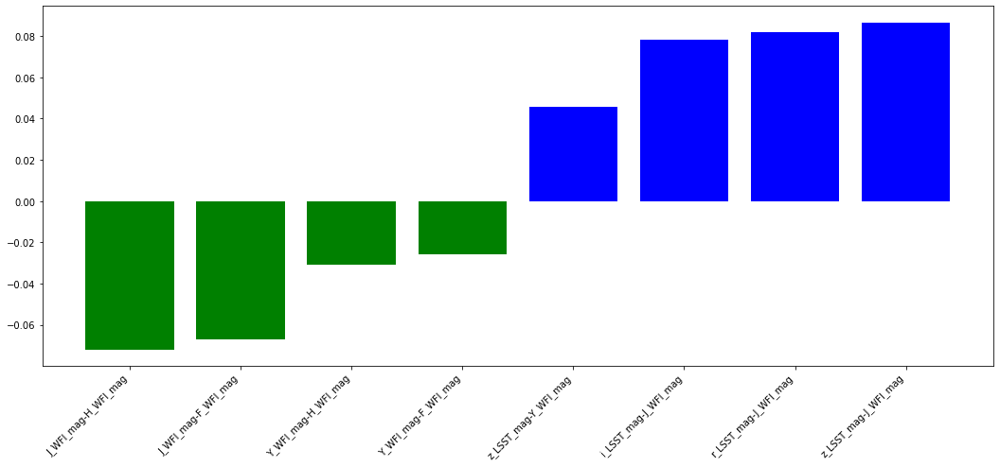

In [24]:
trainedsvm = svm.LinearSVC(max_iter = 2000).fit(X_drop_large_copy, Y_drop_large)
coef = trainedsvm.coef_.ravel()

top_positive_coefficients = np.argsort(coef)[-4:]
top_negative_coefficients = np.argsort(coef)[:4]
top_coefficients = np.hstack([top_negative_coefficients, top_positive_coefficients])
plt.figure(figsize=(18, 7))
colors = ['green' if c < 0 else 'blue' for c in coef[top_coefficients]]
plt.bar(np.arange(2 * 4), coef[top_coefficients], color=colors)
feature_names = np.array(X_drop_large_copy.columns)
plt.xticks(np.arange(2 * 4), feature_names[top_coefficients], rotation=45, ha='right')
plt.show()

In [25]:
# keep the columns with the highest influences & check if the dataframes look reasonable
# with i-band limits
X_drop_large = X_drop_large[['r_LSST_mag', 'i_LSST_mag', 'z_LSST_mag', 'Y_WFI_mag', 'J_WFI_mag', 'H_WFI_mag', 'F_WFI_mag', 'J_WFI_mag-F_WFI_mag', 'J_WFI_mag-H_WFI_mag', 'Y_WFI_mag-F_WFI_mag', 'Y_WFI_mag-H_WFI_mag', 'z_LSST_mag-Y_WFI_mag', 'i_LSST_mag-J_WFI_mag', 'r_LSST_mag-J_WFI_mag', 'z_LSST_mag-J_WFI_mag']]

print(type(X_drop_large))
print('X with i > 24.0: \n', X_drop_large.head())

<class 'pandas.core.frame.DataFrame'>
X with i > 24.0: 
      r_LSST_mag  i_LSST_mag  z_LSST_mag  Y_WFI_mag  J_WFI_mag  H_WFI_mag  \
711   29.048143   24.185493   23.166947  18.311417  18.052475  17.917419   
721   30.896747   24.179287   22.702685  18.312246  18.067672  18.008672   
726   30.909032   24.417370   23.175632  18.282631  18.028988  17.915411   
730   29.321890   24.014710   22.665904  18.216704  18.056068  18.047146   
739   29.176182   24.060176   22.898743  18.315455  18.037333  17.912560   

     F_WFI_mag  J_WFI_mag-F_WFI_mag  J_WFI_mag-H_WFI_mag  Y_WFI_mag-F_WFI_mag  \
711  17.742971             0.309504             0.135056             0.568446   
721  17.847400             0.220272             0.059000             0.464846   
726  17.710876             0.318112             0.113578             0.571756   
730  17.970264             0.085804             0.008922             0.246440   
739  17.711519             0.325815             0.124773             0.603937   


### color-color plots to decide which combinations should be used for decision boundaries 

check which ones are the most "separable"

In [26]:
import seaborn as sns

In [27]:
def color_plot(X, x_lab, y_lab):
    q = sns.jointplot(data=X, x=x_lab, y=y_lab, hue='label', kind='scatter', joint_kws={"alpha": 0.3})

### with missing values dropped

In [26]:
X_drop_small_copy['label'] = Y_drop_small
X_drop_between_copy['label'] = Y_drop_between
X_drop_large_copy['label'] = Y_drop_large

i < 21.0

/data0/sw/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:1598: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))


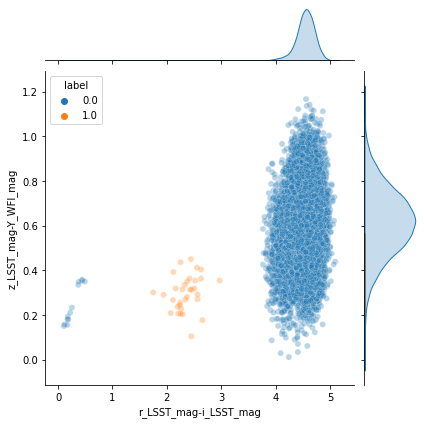

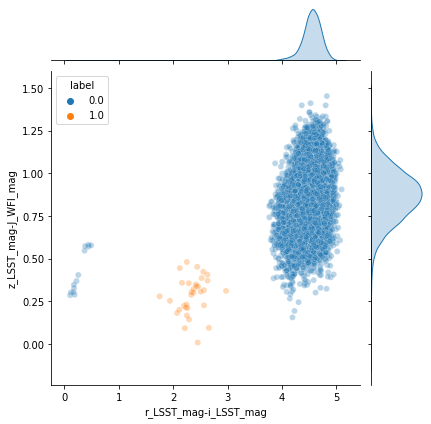

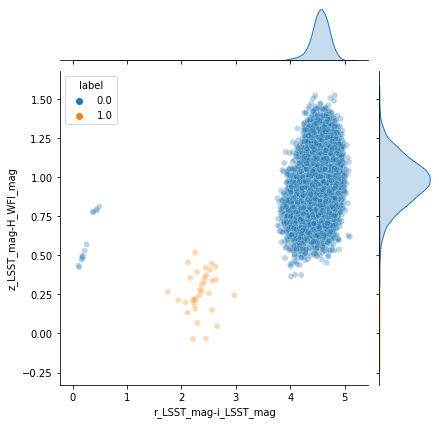

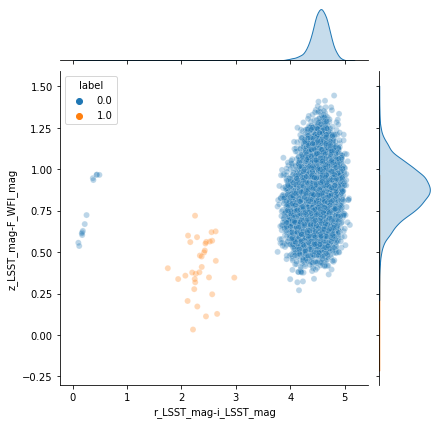

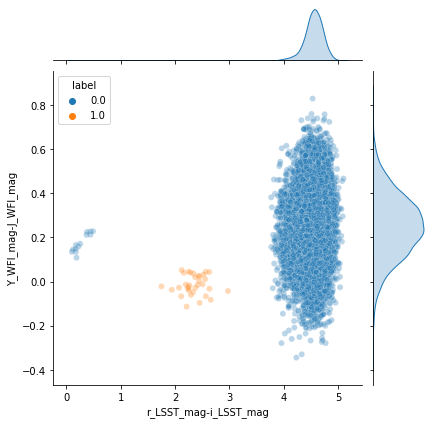

...

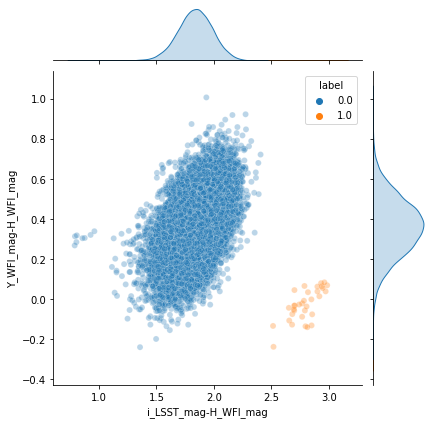

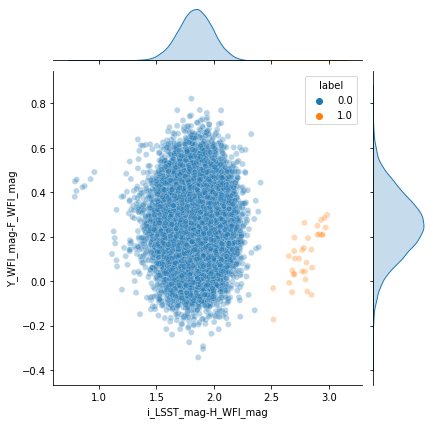

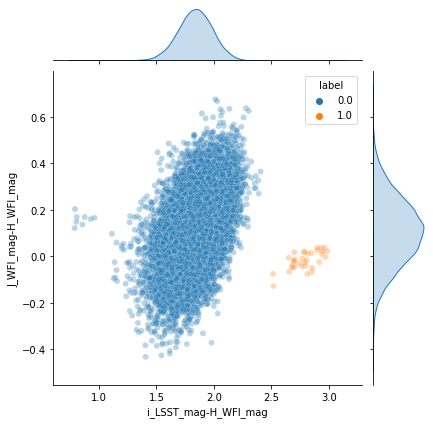

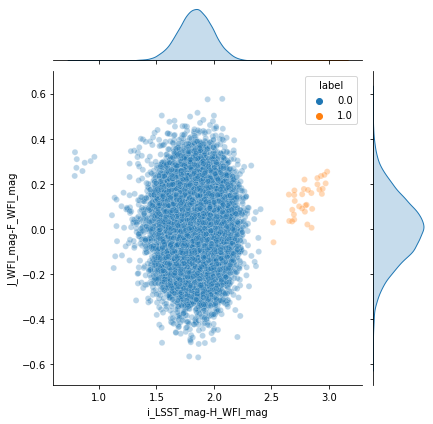

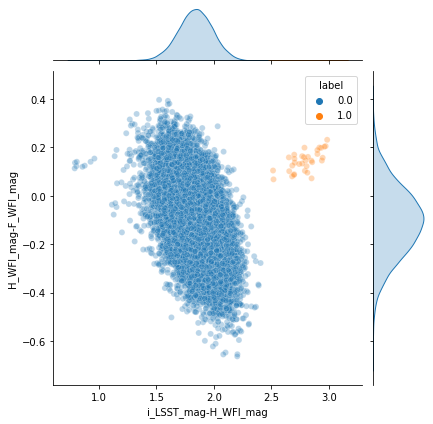

In [27]:
cols = X_drop_small_copy.columns
# print(cols, len(cols))

for i in range(10):
    x_lab = cols[i]
    # range may change later 
    for j in range(11, 21):
        y_lab = cols[j]
        color_plot(X_drop_small_copy, x_lab, y_lab)

21.0 < i < 24.0

/data0/sw/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:1598: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))


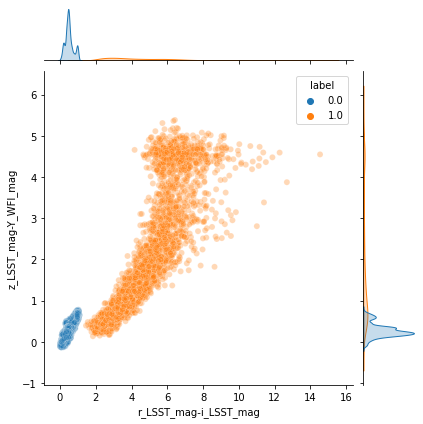

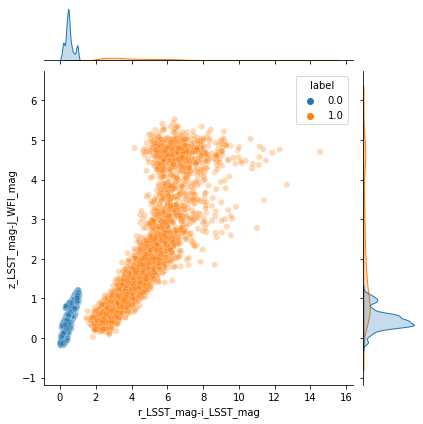

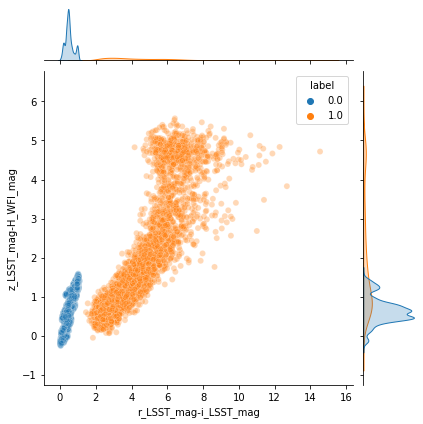

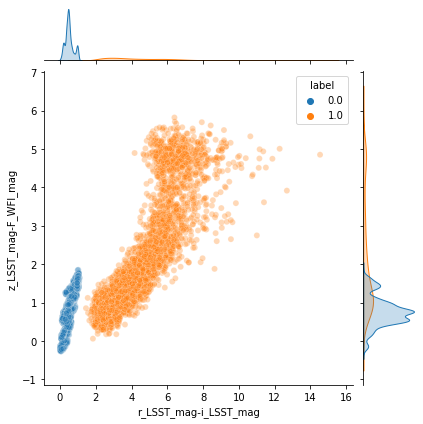

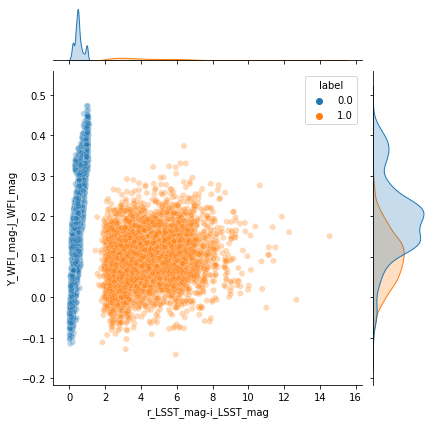

...

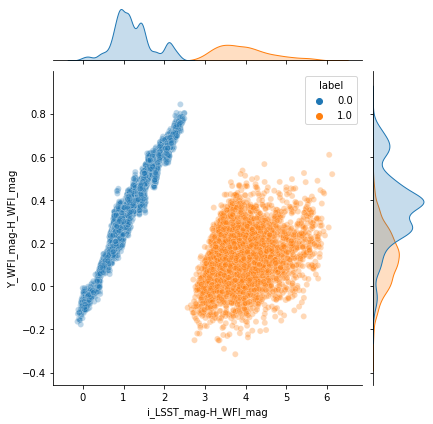

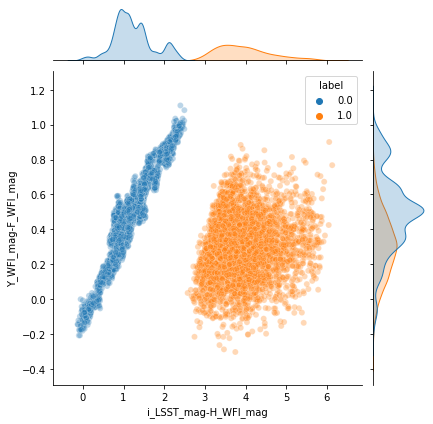

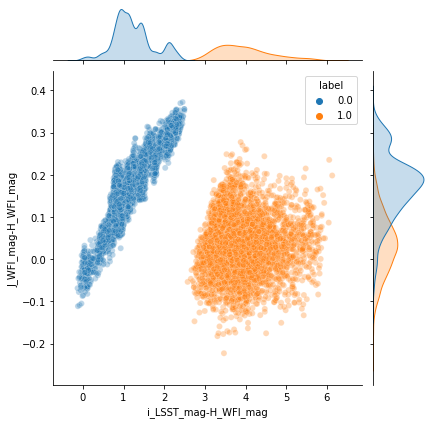

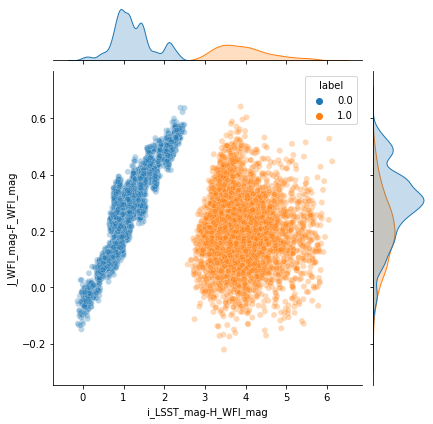

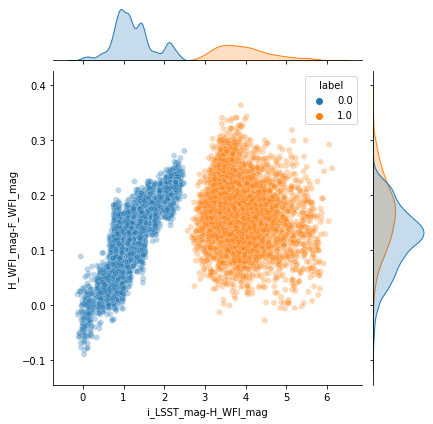

In [29]:
cols_between = X_drop_between_copy.columns
# print(cols_between, len(cols_between))

for i in range(10):
    x_lab = cols_between[i]
    # range may change later 
    for j in range(11, 21):
        y_lab = cols_between[j]
        color_plot(X_drop_between_copy, x_lab, y_lab)

/data0/sw/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:1598: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))


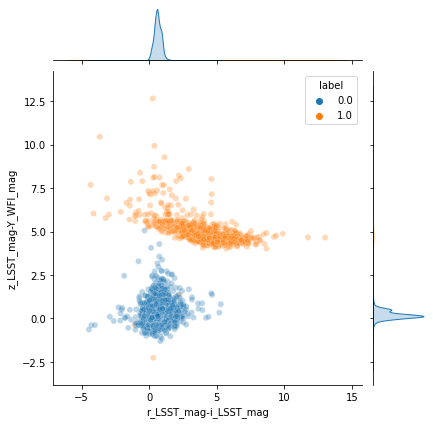

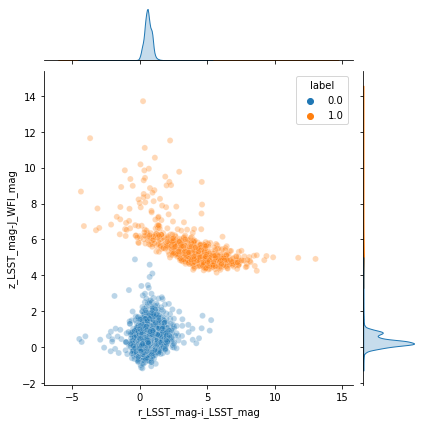

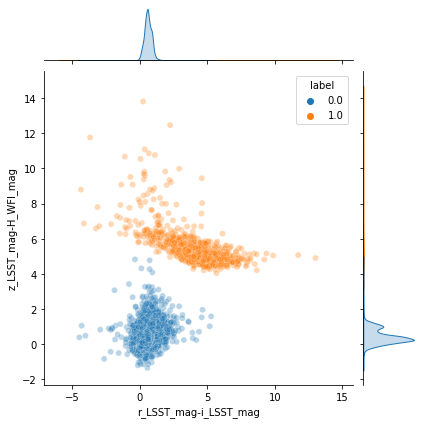

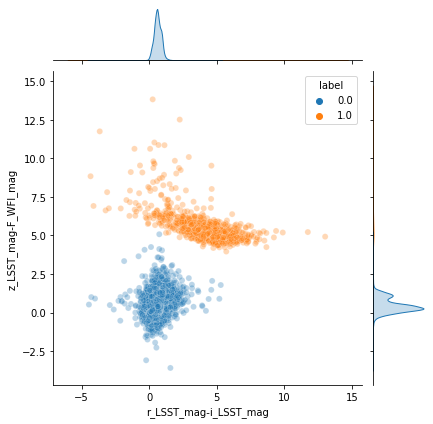

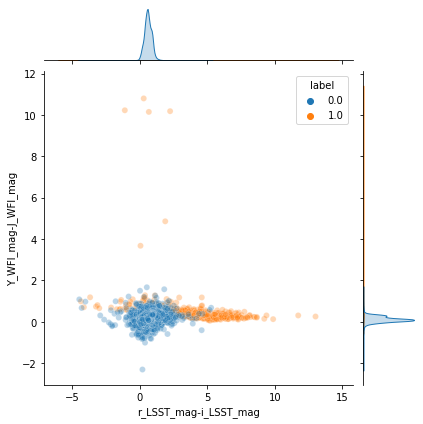

...

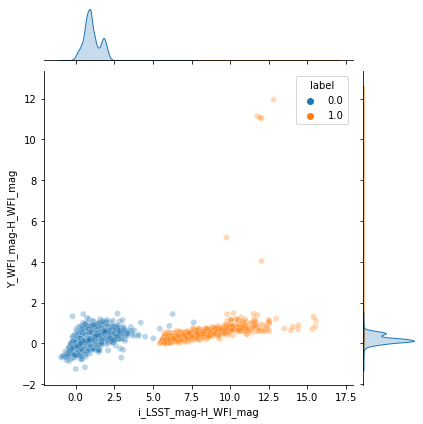

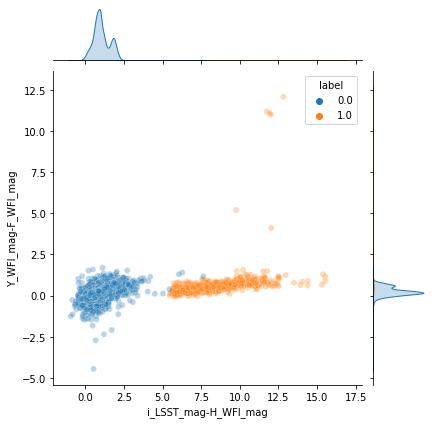

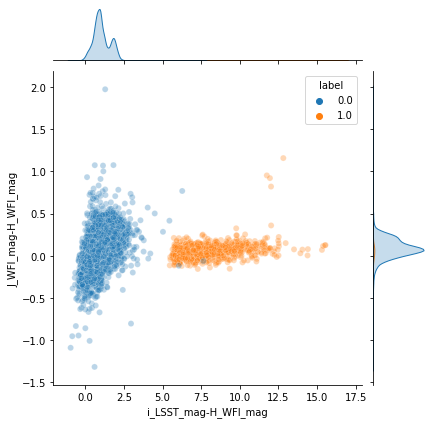

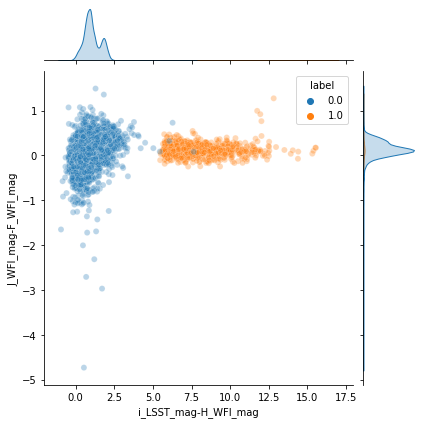

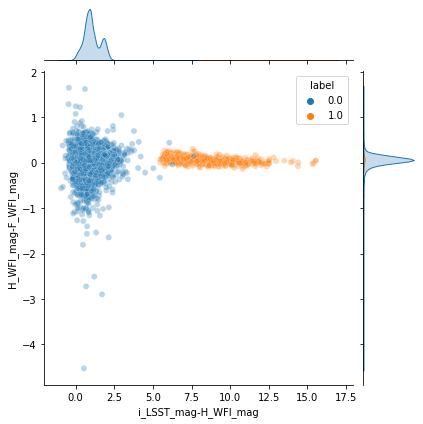

In [30]:
cols_large = X_drop_large_copy.columns
# print(cols_between, len(cols_between))

for i in range(10):
    x_lab = cols_large[i]
    # range may change later 
    for j in range(11, 21):
        y_lab = cols_large[j]
        color_plot(X_drop_large_copy, x_lab, y_lab)

### KNN decision boundaries

k-fold to get some parameter estimations?

In [24]:
def n_neighbor_params(x, y, left_bound, right_bound):
    neighbors = []
    f1_lst_n = []
    train_score_n = []
    test_score_n = []

    for n_neighbor in range(left_bound, right_bound, 1):
        model = KNeighborsClassifier(n_neighbors=n_neighbor)
        kf = KFold(n_splits=10, random_state=42, shuffle=True)
        f1_sum = 0
        train_score_sum = 0
        test_score_sum = 0
        for train_index, test_index in kf.split(x):
            X_train, X_test = x[train_index], x[test_index]
            Y_train, Y_test = y[train_index], y[test_index]
            model.fit(X_train,Y_train)
            Y_pred = model.predict(X_test)
            f1 = f1_score(Y_test, Y_pred)
            f1_sum += f1
            train_score  = model.score(X_train,Y_train) # mean accuracy
            train_score_sum += train_score
            test_score = model.score(X_test,Y_test)
            test_score_sum += test_score
        f1_ave = f1_sum/10 
        train_score_ave = train_score_sum/10
        test_score_ave = test_score_sum/10
        neighbors.append(n_neighbor)
        f1_lst_n.append(f1_ave)
        train_score_n.append(train_score_ave)
        test_score_n.append(test_score_ave)
        print(n_neighbor, train_score_ave, test_score_ave, f1_ave)
    return neighbors, f1_lst_n, train_score_n, test_score_n

In [25]:
def leaf_params(x, y, left_bound, right_bound, n=5):
    leaves = []
    f1_lst_leaf = []
    train_score_leaf = []
    test_score_leaf = []

    for leaf in range(left_bound, right_bound, 1):
        model = KNeighborsClassifier(n_neighbors=n, leaf_size=leaf)
        kf = KFold(n_splits=10, random_state=42, shuffle=True)
        f1_sum = 0
        train_score_sum = 0
        test_score_sum = 0
        for train_index, test_index in kf.split(x):
            X_train, X_test = x[train_index], x[test_index]
            Y_train, Y_test = y[train_index], y[test_index]
            model.fit(X_train,Y_train)
            Y_pred = model.predict(X_test)
            f1 = f1_score(Y_test, Y_pred)
            f1_sum += f1
            train_score  = model.score(X_train,Y_train) # mean accuracy
            train_score_sum += train_score
            test_score = model.score(X_test,Y_test)
            test_score_sum += test_score
        f1_ave = f1_sum/10 
        train_score_ave = train_score_sum/10
        test_score_ave = test_score_sum/10
        leaves.append(leaf)
        f1_lst_leaf.append(f1_ave) 
        train_score_leaf.append(train_score_ave)
        test_score_leaf.append(test_score_ave)
        print(leaf, train_score_ave, test_score_ave, f1_ave)
    return leaves, f1_lst_leaf, train_score_leaf, test_score_leaf

In [26]:
def plot_params_scores(param, f1, train_score, test_score, title):
    plt.plot(param, f1, label='F1 score')
    plt.plot(param, train_score, label='train score')
    plt.plot(param, test_score, label='test score')
    plt.title(title)
    plt.legend()
    plt.show()

In [29]:
def knn_training(x1, x2, y1, y2, y, n, leaves):
    # format x1: X['r']
    # type: n -> list of integers
    features = [x1-x2, y1-y2]
    X = np.array(features).transpose()
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
    grid_params = { 'n_neighbors' : n,
                   'leaf_size': leaves,
                   'weights' :  ['uniform','distance'],
                   'metric' : ['minkowski','euclidean','manhattan']}

    gs = GridSearchCV(KNeighborsClassifier(), grid_params, verbose = 1, cv=3, n_jobs = -1)
    g_res = gs.fit(X_train, y_train)

    print('best score: ', g_res.best_score_)
    print('best params: ', g_res.best_params_)

In [30]:
def get_color_filter(clf, n_neighbors, weights, x1, x2, y1, y2, y):
    # Create color maps
    cmap_light = ListedColormap(['#75aff9', '#f7a844']) # blue, orange
    cmap_bold = ListedColormap(['#8dbcf9', '#f5a844']) 
    
    features = [x1-x2, y1-y2]
    X = np.array(features).transpose()

    # we create an instance of Neighbours Classifier and fit the data.
    clf.fit(X, y)

    # Plot the decision boundary. For that, we will assign a color to each
    # point in the mesh [x_min, x_max]x[y_min, y_max].
    x_min, x_max = min(x1 - x2) - 1, max(x1 - x2) + 1
    y_min, y_max = min(y1 - y2) - 1, max(y1 - y2) + 1
    h = (x_max-x_min)/100
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                         np.arange(y_min, y_max, h))
    Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])

    # Put the result into a color plot
    Z = Z.reshape(xx.shape)
    plt.figure()
    plt.pcolormesh(xx, yy, Z, cmap=cmap_light, alpha=0.15)

    # Plot also the training points
    plt.scatter(X[:, 0], X[:, 1], c=y, cmap=cmap_bold, alpha=0.2)
    plt.axis([x_min, x_max, y_min, y_max])
    plt.title("k = %i, weights = '%s'"
              % (n_neighbors, weights))

In [27]:
X_drop_small_copy = X_drop_small_copy.drop(columns=['label'])
X_drop_between_copy = X_drop_between_copy.drop(columns=['label'])
X_drop_large_copy = X_drop_large_copy.drop(columns=['label'])

In [28]:
print(X_drop_small_copy.head())
print(X_drop_between_copy.head())
print(X_drop_large_copy.head())

   r_LSST_mag-i_LSST_mag  r_LSST_mag-z_LSST_mag  r_LSST_mag-Y_WFI_mag  \
0               2.140482               4.710176              5.135976   
1               1.939859               4.407977              4.697831   
2               1.989819               4.820234              5.235502   
3               2.136383               4.887925              5.203944   
4               2.264339               4.887057              5.114608   

   r_LSST_mag-J_WFI_mag  r_LSST_mag-H_WFI_mag  r_LSST_mag-F_WFI_mag  \
0              5.241418              5.376941              5.633251   
1              4.660279              4.620760              4.745393   
2              5.402469              5.629975              5.950361   
3              5.273789              5.372180              5.608467   
4              5.096871              5.111226              5.256227   

   i_LSST_mag-z_LSST_mag  i_LSST_mag-Y_WFI_mag  i_LSST_mag-J_WFI_mag  \
0               2.569694              2.995494              3.

### with replacement values dropped

i < 21.0

In [38]:
X_drop_small_copy = X_drop_small_copy.to_numpy()
Y_drop_small = np.array(Y_drop_small, dtype=int)

In [39]:
neighborsd, f1_lst_nd, train_score_nd, test_score_nd = n_neighbor_params(X_drop_small_copy, Y_drop_small, 3, 30)

/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


3 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


4 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


5 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


6 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


7 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


8 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


9 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


10 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


11 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


12 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


13 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


14 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


15 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


16 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


17 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


18 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


19 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


20 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


21 0.9999611985682773 0.9998503491769577 0.8683333333333334


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


22 0.9999778282800289 0.9999500998003992 0.8933333333333333


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


23 0.9999334839183133 0.9999002244886785 0.8790476190476191


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


24 0.999972285350036 1.0 0.9
25 0.9998891404783707 0.9998004489773569 0.8683333333333334


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


26 0.9999833702882484 0.9999501246882794 0.8857142857142858


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


27 0.9999611985682773 0.9998503491769577 0.8683333333333334


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


28 0.9999833702882484 0.9999501246882794 0.8857142857142858


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


29 0.999961198568277 0.9998503491769577 0.8683333333333334


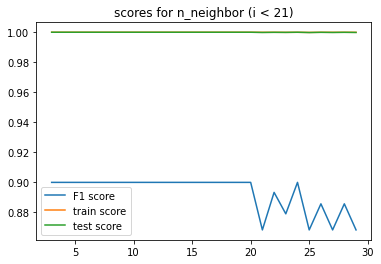

In [40]:
plot_params_scores(neighborsd, f1_lst_nd, train_score_nd, test_score_nd, 'scores for n_neighbor (i < 21)')

In [41]:
df_nd = pd.DataFrame({'n_neighbors': neighborsd, 'F1 score': f1_lst_nd})
df_nd = df_nd.sort_values(by='F1 score', ascending=False)
print(df_nd.head(10))

    n_neighbors  F1 score
0             3       0.9
10           13       0.9
21           24       0.9
17           20       0.9
16           19       0.9
15           18       0.9
14           17       0.9
1             4       0.9
12           15       0.9
11           14       0.9


In [42]:
leavesd, f1_lst_leafd, train_score_leafd, test_score_leafd = leaf_params(X_drop_small_copy, Y_drop_small, 5, 41, 13)

/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


5 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


6 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


7 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


8 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


9 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


10 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


11 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


12 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


13 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


14 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


15 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


16 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


17 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


18 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


19 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


20 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


21 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


22 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


23 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


24 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


25 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


26 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


27 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


28 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


29 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


30 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


31 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


32 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


33 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


34 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


35 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


36 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


37 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


38 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


39 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


40 1.0 1.0 0.9


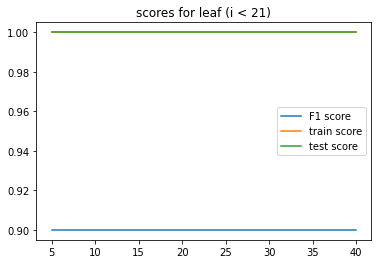

In [43]:
plot_params_scores(leavesd, f1_lst_leafd, train_score_leafd, test_score_leafd, 'scores for leaf (i < 21)')

In [44]:
df_leafd = pd.DataFrame({'leaf_size': leavesd, 'F1 score': f1_lst_leafd})
df_leafd = df_leafd.sort_values(by='F1 score', ascending=False)
print(df_leafd.head(10))

    leaf_size  F1 score
0           5       0.9
1           6       0.9
20         25       0.9
21         26       0.9
22         27       0.9
23         28       0.9
24         29       0.9
25         30       0.9
26         31       0.9
27         32       0.9


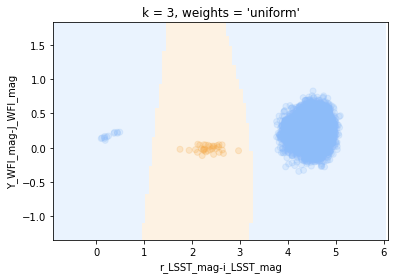

In [54]:
# x: r - i
# y: Y - J
# knn_training(X_drop_small['r_LSST_mag'], X_drop_small['i_LSST_mag'], X_drop_small['Y_WFI_mag'], X_drop_small['J_WFI_mag'], Y_drop_small, [3, 4, 5, 7, 9, 13, 14, 15], [5, 6, 7, 8, 9, 10, 12, 15, 20, 25])

filter1a = KNeighborsClassifier(metric='minkowski', n_neighbors=3, leaf_size=5, weights='uniform')
get_color_filter(filter1a, 3, 'uniform', X_drop_small['r_LSST_mag'], X_drop_small['i_LSST_mag'], X_drop_small['Y_WFI_mag'], X_drop_small['J_WFI_mag'], Y_drop_small)
plt.xlabel('r_LSST_mag-i_LSST_mag')
plt.ylabel('Y_WFI_mag-J_WFI_mag')
plt.show()

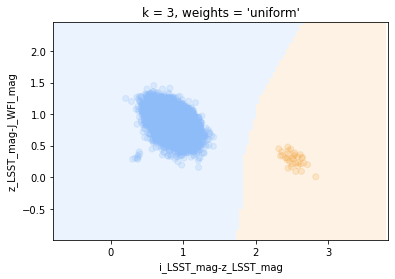

In [55]:
# x: i - z
# y: z - J
# knn_training(X_drop_small['i_LSST_mag'], X_drop_small['z_LSST_mag'], X_drop_small['z_LSST_mag'], X_drop_small['J_WFI_mag'], Y_drop_small, [3, 4, 5, 6, 7, 9, 13, 14, 15], [5, 6, 7, 8, 9, 10, 12, 15, 20, 25])

filter2a = KNeighborsClassifier(metric='minkowski', n_neighbors=3, leaf_size=5, weights='uniform')
get_color_filter(filter2a, 3, 'uniform', X_drop_small['i_LSST_mag'], X_drop_small['z_LSST_mag'], X_drop_small['z_LSST_mag'], X_drop_small['J_WFI_mag'], Y_drop_small)
plt.xlabel('i_LSST_mag-z_LSST_mag')
plt.ylabel('z_LSST_mag-J_WFI_mag')
plt.show()

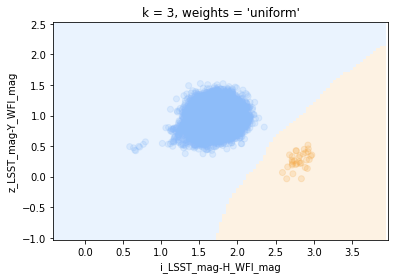

In [56]:
# x: i-H
# y: z-Y
# knn_training(X_drop_small['i_LSST_mag'], X_drop_small['H_WFI_mag'], X_drop_small['z_LSST_mag'], X_drop_small['Y_WFI_mag'], Y_drop_small, [3, 4, 5, 6, 7, 9, 13, 14, 15], [5, 6, 7, 8, 9, 10, 12, 15, 20, 25])

filter3a = KNeighborsClassifier(metric='minkowski', n_neighbors=3, leaf_size=5, weights='uniform')
get_color_filter(filter3a, 3, 'uniform', X_drop_small['i_LSST_mag'], X_drop_small['J_WFI_mag'], X_drop_small['z_LSST_mag'], X_drop_small['H_WFI_mag'], Y_drop_small)
plt.xlabel('i_LSST_mag-H_WFI_mag')
plt.ylabel('z_LSST_mag-Y_WFI_mag')
plt.show()

21 < i < 24

In [45]:
X_drop_between_copy = X_drop_between_copy.to_numpy()
Y_drop_between = np.array(Y_drop_between, dtype=int)

In [46]:
neighbors2, f1_lst_n2, train_score_n2, test_score_n2 = n_neighbor_params(X_drop_between_copy, Y_drop_between, 3, 36)

3 1.0 1.0 1.0
4 1.0 1.0 1.0
5 1.0 1.0 1.0
6 1.0 1.0 1.0
7 1.0 1.0 1.0
8 1.0 1.0 1.0
9 1.0 1.0 1.0
10 1.0 1.0 1.0
11 1.0 1.0 1.0
12 1.0 1.0 1.0
13 1.0 1.0 1.0
14 1.0 1.0 1.0
15 1.0 1.0 1.0
16 1.0 1.0 1.0
17 1.0 1.0 1.0
18 1.0 1.0 1.0
19 1.0 1.0 1.0
20 1.0 1.0 1.0
21 1.0 1.0 1.0
22 1.0 1.0 1.0
23 1.0 1.0 1.0
24 1.0 1.0 1.0
25 1.0 1.0 1.0
26 1.0 1.0 1.0
27 1.0 1.0 1.0
28 1.0 1.0 1.0
29 1.0 1.0 1.0
30 1.0 1.0 1.0
31 1.0 1.0 1.0
32 1.0 1.0 1.0
33 1.0 1.0 1.0
34 1.0 1.0 1.0
35 1.0 1.0 1.0


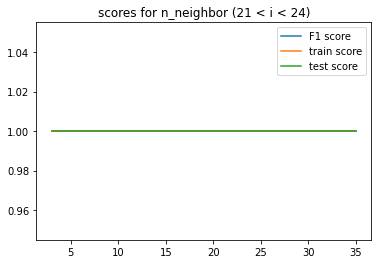

In [47]:
plot_params_scores(neighbors2, f1_lst_n2, train_score_n2, test_score_n2, 'scores for n_neighbor (21 < i < 24)')

In [48]:
df_n2 = pd.DataFrame({'n_neighbors': neighbors2, 'F1 score': f1_lst_n2})
df_n2 = df_n2.sort_values(by='F1 score', ascending=False)
print(df_n2.head(10))

    n_neighbors  F1 score
0             3       1.0
17           20       1.0
31           34       1.0
30           33       1.0
29           32       1.0
28           31       1.0
27           30       1.0
26           29       1.0
25           28       1.0
24           27       1.0


In [49]:
leaves2, f1_lst_leaf2, train_score_leaf2, test_score_leaf2 = leaf_params(X_drop_between_copy, Y_drop_between, 5, 41, 10)

5 1.0 1.0 1.0
6 1.0 1.0 1.0
7 1.0 1.0 1.0
8 1.0 1.0 1.0
9 1.0 1.0 1.0
10 1.0 1.0 1.0
11 1.0 1.0 1.0
12 1.0 1.0 1.0
13 1.0 1.0 1.0
14 1.0 1.0 1.0
15 1.0 1.0 1.0
16 1.0 1.0 1.0
17 1.0 1.0 1.0
18 1.0 1.0 1.0
19 1.0 1.0 1.0
20 1.0 1.0 1.0
21 1.0 1.0 1.0
22 1.0 1.0 1.0
23 1.0 1.0 1.0
24 1.0 1.0 1.0
25 1.0 1.0 1.0
26 1.0 1.0 1.0
27 1.0 1.0 1.0
28 1.0 1.0 1.0
29 1.0 1.0 1.0
30 1.0 1.0 1.0
31 1.0 1.0 1.0
32 1.0 1.0 1.0
33 1.0 1.0 1.0
34 1.0 1.0 1.0
35 1.0 1.0 1.0
36 1.0 1.0 1.0
37 1.0 1.0 1.0
38 1.0 1.0 1.0
39 1.0 1.0 1.0
40 1.0 1.0 1.0


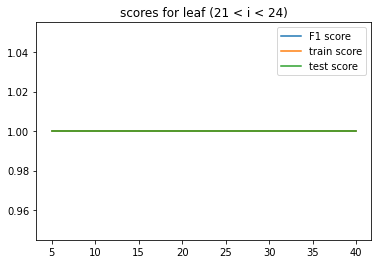

In [50]:
plot_params_scores(leaves2, f1_lst_leaf2, train_score_leaf2, test_score_leaf2, 'scores for leaf (21 < i < 24)')

In [51]:
df_leaf2 = pd.DataFrame({'leaf_size': leaves2, 'F1 score': f1_lst_leaf2})
df_leaf2 = df_leaf2.sort_values(by='F1 score', ascending=False)
print(df_leaf2.head(10))

    leaf_size  F1 score
0           5       1.0
1           6       1.0
20         25       1.0
21         26       1.0
22         27       1.0
23         28       1.0
24         29       1.0
25         30       1.0
26         31       1.0
27         32       1.0


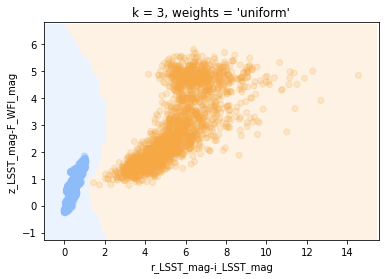

In [32]:
# x: r - i
# y: z - F
# knn_training(X_drop_between['r_LSST_mag'], X_drop_between['i_LSST_mag'], X_drop_between['z_LSST_mag'], X_drop_between['F_WFI_mag'], Y_drop_between, [3, 4, 5, 6, 7, 8, 9, 10, 20], [5, 6, 25, 7, 8, 9, 10, 12, 15, 20])

filter2a = KNeighborsClassifier(metric='minkowski', n_neighbors=3, leaf_size=5, weights='uniform')
get_color_filter(filter2a, 3, 'uniform', X_drop_between['r_LSST_mag'], X_drop_between['i_LSST_mag'], X_drop_between['z_LSST_mag'], X_drop_between['F_WFI_mag'], Y_drop_between)
plt.xlabel('r_LSST_mag-i_LSST_mag')
plt.ylabel('z_LSST_mag-F_WFI_mag')
plt.show()

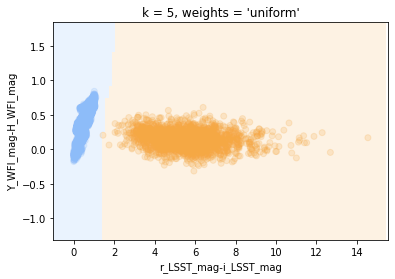

In [33]:
# x: r - i
# y: Y - H
# knn_training(X_drop_between['r_LSST_mag'], X_drop_between['i_LSST_mag'], X_drop_between['Y_WFI_mag'], X_drop_between['H_WFI_mag'], Y_drop_between, [3, 4, 5, 6, 7, 8, 9, 10, 20], [5, 6, 25, 7, 8, 9, 10, 12, 15, 20])

filter2b = KNeighborsClassifier(metric='minkowski', n_neighbors=5, leaf_size=5, weights='uniform')
get_color_filter(filter2b, 5, 'uniform', X_drop_between['r_LSST_mag'], X_drop_between['i_LSST_mag'], X_drop_between['Y_WFI_mag'], X_drop_between['H_WFI_mag'], Y_drop_between)
plt.xlabel('r_LSST_mag-i_LSST_mag')
plt.ylabel('Y_WFI_mag-H_WFI_mag')
plt.show()

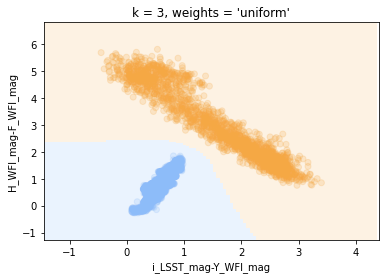

In [34]:
# x: i - J
# y: z - F
# knn_training(X_drop_between['i_LSST_mag'], X_drop_between['J_WFI_mag'], X_drop_between['z_LSST_mag'], X_drop_between['F_WFI_mag'], Y_drop_between, [3, 4, 5, 6, 7, 8, 9, 10, 20], [5, 6, 25, 7, 8, 9, 10, 12, 15, 20])

filter2c = KNeighborsClassifier(metric='minkowski', n_neighbors=3, leaf_size=5, weights='uniform')
get_color_filter(filter2c, 3, 'uniform', X_drop_between['i_LSST_mag'], X_drop_between['z_LSST_mag'], X_drop_between['z_LSST_mag'], X_drop_between['F_WFI_mag'], Y_drop_between)
plt.xlabel('i_LSST_mag-Y_WFI_mag')
plt.ylabel('H_WFI_mag-F_WFI_mag')
plt.show()

i > 24

In [30]:
X_drop_large_copy = X_drop_large_copy.to_numpy()
Y_drop_large = np.array(Y_drop_large, dtype=int)

In [53]:
neighbors3, f1_lst_n3, train_score_n3, test_score_n3 = n_neighbor_params(X_drop_large_copy, Y_drop_large, 3, 36)

3 1.0 1.0 1.0
4 1.0 1.0 1.0
5 1.0 1.0 1.0
6 1.0 1.0 1.0
7 1.0 1.0 1.0
8 1.0 1.0 1.0
9 1.0 1.0 1.0
10 1.0 1.0 1.0
11 1.0 1.0 1.0
12 1.0 1.0 1.0
13 1.0 1.0 1.0
14 1.0 1.0 1.0
15 1.0 1.0 1.0
16 1.0 1.0 1.0
17 1.0 1.0 1.0
18 1.0 1.0 1.0
19 1.0 1.0 1.0
20 1.0 1.0 1.0
21 1.0 1.0 1.0
22 1.0 1.0 1.0
23 1.0 1.0 1.0
24 1.0 1.0 1.0
25 1.0 1.0 1.0
26 1.0 1.0 1.0
27 1.0 1.0 1.0
28 1.0 1.0 1.0
29 1.0 1.0 1.0
30 1.0 1.0 1.0
31 1.0 1.0 1.0
32 1.0 1.0 1.0
33 1.0 1.0 1.0
34 1.0 1.0 1.0
35 1.0 1.0 1.0


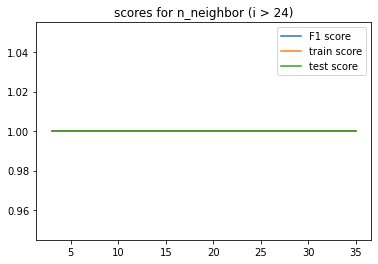

In [54]:
plot_params_scores(neighbors3, f1_lst_n3, train_score_n3, test_score_n3, 'scores for n_neighbor (i > 24)')

In [55]:
df_n3 = pd.DataFrame({'n_neighbors': neighbors3, 'F1 score': f1_lst_n3})
df_n3 = df_n3.sort_values(by='F1 score', ascending=False)
print(df_n2.head(10))

    n_neighbors  F1 score
0             3       1.0
17           20       1.0
31           34       1.0
30           33       1.0
29           32       1.0
28           31       1.0
27           30       1.0
26           29       1.0
25           28       1.0
24           27       1.0


In [32]:
leaves3, f1_lst_leaf3, train_score_leaf3, test_score_leaf3 = leaf_params(X_drop_large_copy, Y_drop_large, 5, 36, 20)

5 1.0 1.0 1.0
6 1.0 1.0 1.0
7 1.0 1.0 1.0
8 1.0 1.0 1.0
9 1.0 1.0 1.0
10 1.0 1.0 1.0
11 1.0 1.0 1.0
12 1.0 1.0 1.0
13 1.0 1.0 1.0
14 1.0 1.0 1.0
15 1.0 1.0 1.0
16 1.0 1.0 1.0
17 1.0 1.0 1.0
18 1.0 1.0 1.0
19 1.0 1.0 1.0
20 1.0 1.0 1.0
21 1.0 1.0 1.0
22 1.0 1.0 1.0
23 1.0 1.0 1.0
24 1.0 1.0 1.0
25 1.0 1.0 1.0
26 1.0 1.0 1.0
27 1.0 1.0 1.0
28 1.0 1.0 1.0
29 1.0 1.0 1.0
30 1.0 1.0 1.0
31 1.0 1.0 1.0
32 1.0 1.0 1.0
33 1.0 1.0 1.0
34 1.0 1.0 1.0
35 1.0 1.0 1.0


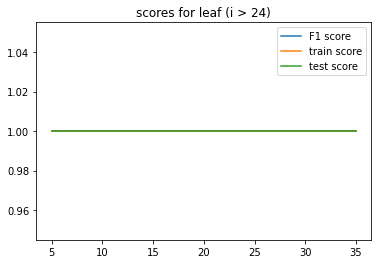

In [33]:
plot_params_scores(leaves3, f1_lst_leaf3, train_score_leaf3, test_score_leaf3, 'scores for leaf (i > 24)')

In [34]:
df_leaf3 = pd.DataFrame({'leaf_size': leaves3, 'F1 score': f1_lst_leaf3})
df_leaf3 = df_leaf3.sort_values(by='F1 score', ascending=False)
print(df_leaf3.head(10))

    leaf_size  F1 score
0           5       1.0
16         21       1.0
29         34       1.0
28         33       1.0
27         32       1.0
26         31       1.0
25         30       1.0
24         29       1.0
23         28       1.0
22         27       1.0


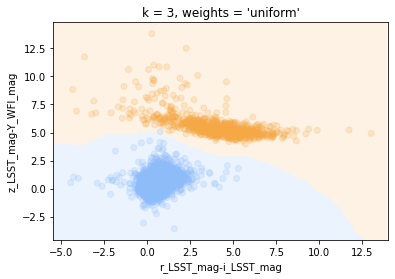

In [35]:
# x: r - i
# y: z - Y
# knn_training(X_drop_large['r_LSST_mag'], X_drop_large['i_LSST_mag'], X_drop_large['z_LSST_mag'], X_drop_large['Y_WFI_mag'], Y_drop_large, [3, 4, 5, 6, 7, 8, 9, 10, 20, 33], [5, 6, 25, 7, 8, 9, 10, 12, 15, 21])

filter3a = KNeighborsClassifier(metric='minkowski', n_neighbors=3, leaf_size=5, weights='uniform')
get_color_filter(filter3a, 3, 'uniform', X_drop_large['r_LSST_mag'], X_drop_large['i_LSST_mag'], X_drop_large['z_LSST_mag'], X_drop_large['F_WFI_mag'], Y_drop_large)
plt.xlabel('r_LSST_mag-i_LSST_mag')
plt.ylabel('z_LSST_mag-Y_WFI_mag')
plt.show()

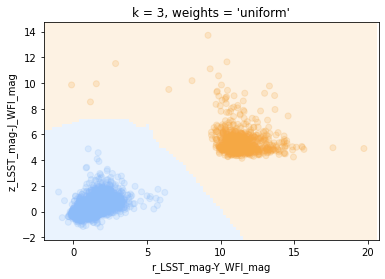

In [36]:
# x: r - Y
# y: z - J
# knn_training(X_drop_large['r_LSST_mag'], X_drop_large['Y_WFI_mag'], X_drop_large['z_LSST_mag'], X_drop_large['J_WFI_mag'], Y_drop_large, [3, 5, 6, 7, 8, 9, 10, 20, 33], [5, 6, 25, 7, 8, 9, 10, 12, 15, 21])

filter3b = KNeighborsClassifier(metric='minkowski', n_neighbors=3, leaf_size=5, weights='uniform')
get_color_filter(filter3b, 3, 'uniform', X_drop_large['r_LSST_mag'], X_drop_large['Y_WFI_mag'], X_drop_large['z_LSST_mag'], X_drop_large['J_WFI_mag'], Y_drop_large)
plt.xlabel('r_LSST_mag-Y_WFI_mag')
plt.ylabel('z_LSST_mag-J_WFI_mag')
plt.show()

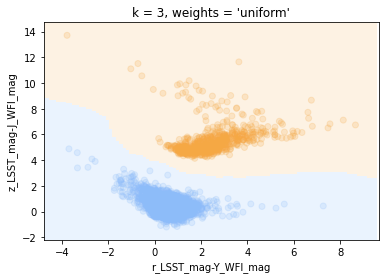

In [37]:
# x: i - z
# y: z - J
# knn_training(X_drop_large['i_LSST_mag'], X_drop_large['z_LSST_mag'], X_drop_large['z_LSST_mag'], X_drop_large['J_WFI_mag'], Y_drop_large, [3, 5, 6, 7, 8, 9, 10, 20, 33], [5, 6, 25, 7, 8, 9, 10, 12, 15, 21])

filter3c = KNeighborsClassifier(metric='minkowski', n_neighbors=3, leaf_size=5, weights='uniform')
get_color_filter(filter3c, 3, 'uniform', X_drop_large['i_LSST_mag'], X_drop_large['z_LSST_mag'], X_drop_large['z_LSST_mag'], X_drop_large['J_WFI_mag'], Y_drop_large)
plt.xlabel('r_LSST_mag-Y_WFI_mag')
plt.ylabel('z_LSST_mag-J_WFI_mag')
plt.show()

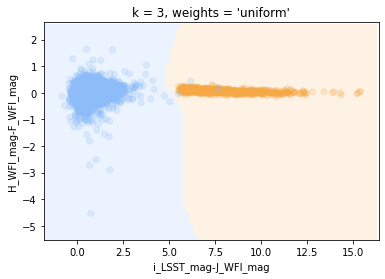

In [38]:
# x: i - J
# y: H - F
# knn_training(X_drop_large['i_LSST_mag'], X_drop_large['J_WFI_mag'], X_drop_large['H_WFI_mag'], X_drop_large['F_WFI_mag'], Y_drop_large, [3, 5, 6, 7, 8, 9, 10, 20, 33], [5, 6, 25, 7, 8, 9, 10, 12, 15, 21])

filter3d = KNeighborsClassifier(metric='minkowski', n_neighbors=3, leaf_size=5, weights='uniform')
get_color_filter(filter3d, 3, 'uniform', X_drop_large['i_LSST_mag'], X_drop_large['J_WFI_mag'], X_drop_large['H_WFI_mag'], X_drop_large['F_WFI_mag'], Y_drop_large)
plt.xlabel('i_LSST_mag-J_WFI_mag')
plt.ylabel('H_WFI_mag-F_WFI_mag')
plt.show()

## Test

In [39]:
qso_test = pd.read_csv('quasar_test_catalog.csv', index_col=False)
qso_test = qso_test[['r_LSST_mag', 'i_LSST_mag', 'z_LSST_mag', 'Y_WFI_mag', 'J_WFI_mag', 'H_WFI_mag', 'F_WFI_mag']]
qso_test.describe()

,r_LSST_mag,i_LSST_mag,z_LSST_mag,Y_WFI_mag,J_WFI_mag,H_WFI_mag,F_WFI_mag
count,25000.000000,25000.000000,25000.000000,25000.000000,25000.000000,25000.000000,25000.000000
mean,65.648371,56.107987,48.140213,35.209410,33.953109,34.408229,37.056265
std,34.999899,34.613620,32.917434,23.354992,21.852365,22.439000,25.883666
min,23.737275,21.400500,18.803401,18.181244,18.048911,17.986569,17.740505
25%,29.821013,28.555122,27.003421,25.704790,25.564225,25.613446,25.462108
50%,99.990000,29.953924,28.268598,27.587399,27.489070,27.495992,27.226590
75%,99.990000,99.990000,99.990000,28.891448,28.744201,28.762242,28.663621
max,99.990000,99.990000,99.990000,99.990000,99.990000,99.990000,99.990000


In [40]:
galaxies_patch8788_partial = read_data_partial('galaxies_train_catalog_patch8788.csv', 'galaxies_patch8788_partial.csv')
print('galaxies_train_catalog_patch8788.csv partial data description: ')
galaxies_patch8788_partial.describe()

galaxies_train_catalog_patch8788.csv partial data description: 


,ra_d,dec_d,z,redsq_flag,u_LSST_mag,u_LSST_magerr,g_LSST_mag,g_LSST_magerr,r_LSST_mag,r_LSST_magerr,...,z_LSST_mag,z_LSST_magerr,Y_WFI_mag,Y_WFI_magerr,J_WFI_mag,J_WFI_magerr,H_WFI_mag,H_WFI_magerr,F_WFI_mag,F_WFI_magerr
count,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,...,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000
mean,23.756580,-22.336886,1.032695,0.206810,31.865539,1.664620,27.095620,0.426634,25.869858,0.090803,...,24.651582,0.116117,24.353000,0.046214,24.208583,0.041196,24.100513,0.040888,24.039632,0.071686
std,13.727285,13.457052,0.014251,0.405028,19.671504,67.272044,7.854143,20.170242,2.970428,0.466100,...,2.711824,1.867361,1.421210,0.052759,1.359922,0.039060,1.408869,0.076789,1.551048,0.674135
min,0.005785,-47.497992,1.005989,0.000000,20.799293,0.000000,20.945724,0.000000,20.964661,0.000000,...,20.199310,0.000000,19.730171,0.000000,19.315425,0.010143,18.971169,0.010027,18.750817,0.000000
25%,11.733755,-33.606524,1.020423,0.000000,25.247719,0.058302,25.311052,0.035975,24.941155,0.026174,...,23.824312,0.032802,23.596931,0.019817,23.429763,0.018021,23.301662,0.017404,23.219071,0.022461
50%,23.895896,-21.660677,1.034144,0.000000,26.489127,0.194314,26.391954,0.081985,25.913941,0.049719,...,24.704255,0.061873,24.515632,0.032787,24.393318,0.029589,24.310903,0.028905,24.255154,0.042657
75%,35.661293,-10.672523,1.045282,0.000000,27.598871,0.474694,27.330566,0.178909,26.697344,0.091973,...,25.455755,0.114201,25.268753,0.056047,25.168173,0.049974,25.108181,0.049543,25.070309,0.079083
max,47.496031,-0.000724,1.055212,1.000000,99.990000,9080.560484,99.990000,2753.077529,99.990000,43.286299,...,99.990000,251.215935,99.990000,4.157023,29.046655,1.527037,30.885336,9.494070,99.990000,82.927110


In [41]:
galaxies_patch8788_partial = galaxies_patch8788_partial[['r_LSST_mag', 'i_LSST_mag', 'z_LSST_mag', 'Y_WFI_mag', 'J_WFI_mag', 'H_WFI_mag', 'F_WFI_mag']]
print(galaxies_patch8788_partial.head())

   r_LSST_mag  i_LSST_mag  z_LSST_mag  Y_WFI_mag  J_WFI_mag  H_WFI_mag  \
0   25.620305   25.035081   24.485231  24.423544  24.362241  24.324362   
1   25.230872   24.969824   24.395539  24.525811  24.546824  24.499536   
2   22.512334   22.275706   21.872768  21.677942  21.504141  21.340062   
3   27.865488   27.073493   26.192273  25.807305  25.627332  25.391634   
4   26.384361   25.518046   24.590732  24.114798  23.795983  23.585326   

   F_WFI_mag  
0  24.268830  
1  24.562695  
2  21.221775  
3  25.310328  
4  23.490337  


In [42]:
mlt_test = read_data_partial('mlt_test_catalog_max24.csv', 'mlt_test_catalog_partial.csv', )
mlt_test = mlt_test[['r_LSST_mag', 'i_LSST_mag', 'z_LSST_mag', 'Y_WFI_mag', 'J_WFI_mag', 'H_WFI_mag', 'F_WFI_mag']]
print('mlt_test_catalog partial data description: ')
mlt_test.describe()

mlt_test_catalog partial data description: 


,r_LSST_mag,i_LSST_mag,z_LSST_mag,Y_WFI_mag,J_WFI_mag,H_WFI_mag,F_WFI_mag
count,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000,19999.000000
mean,26.926689,22.174019,21.164776,20.363206,20.066301,19.937946,20.002332
std,0.200677,0.120493,0.161657,0.162586,0.162807,0.163030,0.163780
min,26.194485,22.000014,20.394267,19.725846,19.393827,19.264649,19.362965
25%,26.789641,22.074817,21.055488,20.253683,19.957080,19.826876,19.891932
50%,26.918773,22.155908,21.169774,20.367118,20.068748,19.941408,20.005348
75%,27.056720,22.254488,21.277619,20.477338,20.180303,20.051468,20.116187
max,27.905773,22.687161,21.753210,21.182426,20.963738,20.801828,20.993568


In [68]:
qso_test_copy = qso_test.copy()
qso_test_copy['label'] = np.ones(len(qso_test_copy))
galaxies_patch8788_pcopy = galaxies_patch8788_partial.copy()
galaxies_patch8788_pcopy['label'] = np.zeros(len(galaxies_patch8788_pcopy))
test_wgal = pd.concat([qso_test_copy, galaxies_patch8788_pcopy], ignore_index=True)
print(test_wgal.describe())

         r_LSST_mag    i_LSST_mag    z_LSST_mag     Y_WFI_mag     J_WFI_mag  \
count  44999.000000  44999.000000  44999.000000  44999.000000  44999.000000   
mean      47.969523     42.385887     37.701112     30.384473     29.622329   
std       32.789956     30.056330     27.230051     18.249165     17.016506   
min       20.964661     20.738443     18.803401     18.181244     18.048911   
25%       26.108564     25.457826     24.589408     24.219371     24.089289   
50%       29.098091     27.776565     26.166768     25.565317     25.455884   
75%       99.990000     30.578948     28.596754     27.841186     27.743223   
max       99.990000     99.990000     99.990000     99.990000     99.990000   

          H_WFI_mag     F_WFI_mag         label  
count  44999.000000  44999.000000  44999.000000  
mean      29.827149     31.271255      0.555568  
std       17.516998     20.374225      0.496908  
min       17.986569     17.740505      0.000000  
25%       24.026803     23.936007     

In [45]:
mlt_test_copy = mlt_test.copy()
mlt_test_copy['label'] = np.zeros(len(mlt_test_copy))
test = pd.concat([qso_test_copy, galaxies_patch8788_pcopy, mlt_test_copy], ignore_index=True)
test.describe()

,r_LSST_mag,i_LSST_mag,z_LSST_mag,Y_WFI_mag,J_WFI_mag,H_WFI_mag,F_WFI_mag,label
count,64998.000000,64998.000000,64998.000000,64998.000000,64998.000000,64998.000000,64998.000000,64998.000000
mean,41.494929,36.166971,32.613106,27.301066,26.682069,26.784376,27.803961,0.384627
std,28.960228,26.691700,23.907913,15.873303,14.829919,15.273254,17.732538,0.486511
min,20.964661,20.738443,18.803401,18.181244,18.048911,17.986569,17.740505,0.000000
25%,26.648108,22.273506,21.303424,20.507608,20.211694,20.081580,20.145379,0.000000
50%,27.078660,25.629694,24.755012,24.373978,24.249103,24.193706,24.115527,0.000000
75%,30.470443,29.011888,27.579617,26.698436,26.583893,26.606885,26.459749,1.000000
max,99.990000,99.990000,99.990000,99.990000,99.990000,99.990000,99.990000,1.000000


### KNN dropping missing values (i-band cuts)

i < 21

In [68]:
qso_test_small = qso_test[qso_test['i_LSST_mag'] < 21.0]
qso_test_small_copy = qso_test_small.copy()
print(len(qso_test_small))

0


21 < i < 24

In [71]:
qso_test_between = qso_test[qso_test['i_LSST_mag'] < 24.0]
qso_test_between_copy = qso_test_between.copy()
print(len(qso_test_between))

54


In [81]:
# x: r - i
# y: z - F

features2a = [X_drop_between['r_LSST_mag']-X_drop_between['i_LSST_mag'], X_drop_between['z_LSST_mag']-X_drop_between['F_WFI_mag']]
X2a = np.array(features2a).transpose()
filter2a.fit(X2a, Y_drop_between)
labels = filter2a.predict(np.array([qso_test_between_copy['r_LSST_mag']-qso_test_between_copy['i_LSST_mag'], qso_test_between_copy['z_LSST_mag']-qso_test_between_copy['F_WFI_mag']]).transpose())

qso_test_between_copy['label'] = labels
qso_test_between_copy = qso_test_between_copy[qso_test_between_copy['label'] == 1]
print(len(qso_test_between_copy))

# x: r - i
# y: Y - H
features2b = [X_drop_between['r_LSST_mag']-X_drop_between['i_LSST_mag'], X_drop_between['Y_WFI_mag']-X_drop_between['H_WFI_mag']]
X2b = np.array(features2b).transpose()
filter2b.fit(X2b, Y_drop_between)
labels = filter2b.predict(np.array([qso_test_between_copy['r_LSST_mag']-qso_test_between_copy['i_LSST_mag'], qso_test_between_copy['Y_WFI_mag']-qso_test_between_copy['H_WFI_mag']]).transpose())

qso_test_between_copy['label'] = labels
qso_test_between_copy = qso_test_between_copy[qso_test_between_copy['label'] == 1]
print(len(qso_test_between_copy))

# x: i - J
# y: z - F
features2c = [X_drop_between['i_LSST_mag']-X_drop_between['J_WFI_mag'], X_drop_between['z_LSST_mag']-X_drop_between['F_WFI_mag']]
X2c = np.array(features2c).transpose()
filter2c.fit(X2c, Y_drop_between)
labels = filter2c.predict(np.array([qso_test_between_copy['i_LSST_mag']-qso_test_between_copy['J_WFI_mag'], qso_test_between_copy['z_LSST_mag']-qso_test_between_copy['F_WFI_mag']]).transpose())

qso_test_between_copy['label'] = labels
qso_test_between_copy = qso_test_between_copy[qso_test_between_copy['label'] == 1]
labels = qso_test_between_copy['label']

print(len(qso_test_between_copy))

54
54
54


with galaxies added

In [69]:
test_wgal_copy = test_wgal.copy()
test_wgal_copy = test_wgal_copy.drop(columns=['label'])
test_wgal_copy = test_wgal_copy[test_wgal_copy['i_LSST_mag'] > 22.0]
test_wgal_copy = test_wgal_copy[test_wgal_copy['i_LSST_mag'] < 24.0]
print(len(test_wgal_copy))

3417


In [70]:
# x: r - i
# y: z - F

features2a = [X_drop_between['r_LSST_mag']-X_drop_between['i_LSST_mag'], X_drop_between['z_LSST_mag']-X_drop_between['F_WFI_mag']]
X2a = np.array(features2a).transpose()
filter2a.fit(X2a, Y_drop_between)
labels = filter2a.predict(np.array([test_wgal_copy['r_LSST_mag']-test_wgal_copy['i_LSST_mag'], test_wgal_copy['z_LSST_mag']-test_wgal_copy['F_WFI_mag']]).transpose())

test_wgal_copy['label'] = labels
test_wgal_copy = test_wgal_copy[test_wgal_copy['label'] == 1]
print(len(test_wgal_copy))

# x: r - i
# y: Y - H
features2b = [X_drop_between['r_LSST_mag']-X_drop_between['i_LSST_mag'], X_drop_between['Y_WFI_mag']-X_drop_between['H_WFI_mag']]
X2b = np.array(features2b).transpose()
filter2b.fit(X2b, Y_drop_between)
labels = filter2b.predict(np.array([test_wgal_copy['r_LSST_mag']-test_wgal_copy['i_LSST_mag'], test_wgal_copy['Y_WFI_mag']-test_wgal_copy['H_WFI_mag']]).transpose())

test_wgal_copy['label'] = labels
test_wgal_copy = test_wgal_copy[test_wgal_copy['label'] == 1]
print(len(test_wgal_copy))

# x: i - J
# y: z - F
features2c = [X_drop_between['i_LSST_mag']-X_drop_between['J_WFI_mag'], X_drop_between['z_LSST_mag']-X_drop_between['F_WFI_mag']]
X2c = np.array(features2c).transpose()
filter2c.fit(X2c, Y_drop_between)
labels = filter2c.predict(np.array([test_wgal_copy['i_LSST_mag']-test_wgal_copy['J_WFI_mag'], test_wgal_copy['z_LSST_mag']-test_wgal_copy['F_WFI_mag']]).transpose())

test_wgal_copy['label'] = labels
test_wgal_copy = test_wgal_copy[test_wgal_copy['label'] == 1]
print(len(test_wgal_copy))

53
53
53


In [71]:
a = test_wgal[(test_wgal['label'] == 1) & ( test_wgal['i_LSST_mag'] > 22.0) &  ( test_wgal['i_LSST_mag'] < 24.0)]
print (len(a))
quasar_index = np.sort(np.array((a.index)))

53


In [72]:
b = test_wgal_copy[(test_wgal_copy['label'] == 1) & ( test_wgal_copy['i_LSST_mag'] > 22.0) & ( test_wgal_copy['i_LSST_mag'] <24.0)]
predict_index = np.sort(np.array(b.index))

In [73]:
np.all(a==b)

True

In [75]:
print(set(a).issubset(set(b)))

True


with galaxies and brown dwarfs

In [66]:
test_copy = test.copy()
print(len(test_copy))
test_copy = test_copy[test_copy['i_LSST_mag'] > 22.0]
test_copy = test_copy[test_copy['i_LSST_mag'] < 24.0]
print(len(test_copy))
print(len(test_copy[test_copy['label'] == 1]))

64998
23416
53


In [51]:
features2a = [X_drop_between['r_LSST_mag']-X_drop_between['i_LSST_mag'], X_drop_between['z_LSST_mag']-X_drop_between['F_WFI_mag']]
X2a = np.array(features2a).transpose()
filter2a.fit(X2a, Y_drop_between)

features2b = [X_drop_between['r_LSST_mag']-X_drop_between['i_LSST_mag'], X_drop_between['Y_WFI_mag']-X_drop_between['H_WFI_mag']]
X2b = np.array(features2b).transpose()
filter2b.fit(X2b, Y_drop_between)

features2c = [X_drop_between['i_LSST_mag']-X_drop_between['J_WFI_mag'], X_drop_between['z_LSST_mag']-X_drop_between['F_WFI_mag']]
X2c = np.array(features2c).transpose()
filter2c.fit(X2c, Y_drop_between)

KNeighborsClassifier(leaf_size=5, n_neighbors=3)

In [47]:
# x: r - i
# y: z - F

labels = filter2a.predict(np.array([test_copy['r_LSST_mag']-test_copy['i_LSST_mag'], test_copy['z_LSST_mag']-test_copy['F_WFI_mag']]).transpose())

test_copy['label'] = labels
test_copy = test_copy[test_copy['label'] == 1]
print(len(test_copy))

# x: r - i
# y: Y - H
labels = filter2b.predict(np.array([test_copy['r_LSST_mag']-test_copy['i_LSST_mag'], test_copy['Y_WFI_mag']-test_copy['H_WFI_mag']]).transpose())

test_copy['label'] = labels
test_copy = test_copy[test_copy['label'] == 1]
print(len(test_copy))

# x: i - J
# y: z - F
labels = filter2c.predict(np.array([test_copy['i_LSST_mag']-test_copy['J_WFI_mag'], test_copy['z_LSST_mag']-test_copy['F_WFI_mag']]).transpose())

test_copy['label'] = labels
test_copy = test_copy[test_copy['label'] == 1]
labels = test_copy['label']

print(len(test_copy))

20052
20052
54


In [76]:
print(set(test_copy[test_copy['label'] == 1]).issubset(test_copy))

True


filter c is so efficient; filter a and b are almost the same considering their colors though they look different

i > 24.0

try until i = 24.5

In [50]:
mlt_test_245 = read_data_partial('mlt_test_catalog_max245.csv', 'mlt_test_catalog_partial2.csv', )
mlt_test_245 = mlt_test_245[['r_LSST_mag', 'i_LSST_mag', 'z_LSST_mag', 'Y_WFI_mag', 'J_WFI_mag', 'H_WFI_mag', 'F_WFI_mag']]
mlt_test245_copy = mlt_test_245.copy()
mlt_test245_copy['label'] = np.zeros(len(mlt_test245_copy))
test_245 = pd.concat([qso_test_copy, galaxies_patch8788_pcopy, mlt_test245_copy], ignore_index=True)
test_245.describe()

,r_LSST_mag,i_LSST_mag,z_LSST_mag,Y_WFI_mag,J_WFI_mag,H_WFI_mag,F_WFI_mag,label
count,64998.000000,64998.000000,64998.000000,64998.000000,64998.000000,64998.000000,64998.000000,64998.000000
mean,41.494929,36.166971,32.613106,27.301066,26.682069,26.784376,27.803961,0.384627
std,28.960228,26.691700,23.907913,15.873303,14.829919,15.273254,17.732538,0.486511
min,20.964661,20.738443,18.803401,18.181244,18.048911,17.986569,17.740505,0.000000
25%,26.648108,22.273506,21.303424,20.507608,20.211694,20.081580,20.145379,0.000000
50%,27.078660,25.629694,24.755012,24.373978,24.249103,24.193706,24.115527,0.000000
75%,30.470443,29.011888,27.579617,26.698436,26.583893,26.606885,26.459749,1.000000
max,99.990000,99.990000,99.990000,99.990000,99.990000,99.990000,99.990000,1.000000


In [63]:
test245_copy = test_245.copy()
test245_copy = test245_copy[test245_copy['i_LSST_mag'] > 24.0]
test245_copy = test245_copy[test245_copy['i_LSST_mag'] < 24.5]
print('total test size:', len(test245_copy))
print('total quasar size:',len(test245_copy[test245_copy['label'] == 1]))

total test size: 1782
total quasar size: 59


In [56]:
features3a = [X_drop_large['r_LSST_mag']-X_drop_large['i_LSST_mag'], X_drop_large['z_LSST_mag']-X_drop_large['Y_WFI_mag']]
X3a = np.array(features3a).transpose()
filter3a.fit(X3a, Y_drop_large)

features3b = [X_drop_large['r_LSST_mag']-X_drop_large['Y_WFI_mag'], X_drop_large['z_LSST_mag']-X_drop_large['J_WFI_mag']]
X3b = np.array(features3b).transpose()
filter3b.fit(X3b, Y_drop_large)

features3c = [X_drop_large['i_LSST_mag']-X_drop_large['z_LSST_mag'], X_drop_large['z_LSST_mag']-X_drop_large['J_WFI_mag']]
X3c = np.array(features3c).transpose()
filter3c.fit(X3c, Y_drop_large)

features3d = [X_drop_large['i_LSST_mag']-X_drop_large['J_WFI_mag'], X_drop_large['H_WFI_mag']-X_drop_large['F_WFI_mag']]
X3c = np.array(features3c).transpose()
filter3c.fit(X3c, Y_drop_large)

KNeighborsClassifier(leaf_size=5, n_neighbors=3)

In [64]:
# x: r - i
# y: z - Y
labels = filter3a.predict(np.array([test245_copy['r_LSST_mag']-test245_copy['i_LSST_mag'], test245_copy['z_LSST_mag']-test245_copy['Y_WFI_mag']]).transpose())

test245_copy['label'] = labels
test245_copy = test245_copy[test245_copy['label'] == 1]
print(len(test245_copy))

# x: r - Y
# y: z - J
labels = filter3b.predict(np.array([test245_copy['r_LSST_mag']-test245_copy['Y_WFI_mag'], test245_copy['z_LSST_mag']-test245_copy['J_WFI_mag']]).transpose())

test245_copy['label'] = labels
test245_copy = test245_copy[test245_copy['label'] == 1]
print(len(test245_copy))

# x: i - z
# y: z - J
labels = filter3c.predict(np.array([test245_copy['i_LSST_mag']-test245_copy['z_LSST_mag'], test245_copy['z_LSST_mag']-test245_copy['J_WFI_mag']]).transpose())

test245_copy['label'] = labels
test245_copy = test245_copy[test245_copy['label'] == 1]
print(len(test245_copy))

# x: i - J
# y: H - F
labels = filter3c.predict(np.array([test245_copy['i_LSST_mag']-test245_copy['J_WFI_mag'], test245_copy['H_WFI_mag']-test245_copy['F_WFI_mag']]).transpose())

test245_copy['label'] = labels
test245_copy = test245_copy[test245_copy['label'] == 1]

print(len(test245_copy))

5
5
1
0


## random forest

In [35]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV

In [43]:
def estimator_params(x, y, left_bound, right_bound, step=10):
    estimators = []
    f1_lst_e = []
    train_score_e = []
    test_score_e = []

    for n_estimator in range(left_bound, right_bound, step):
        model = RandomForestClassifier(n_estimators=n_estimator, random_state=42)
        kf = KFold(n_splits=10, random_state=42, shuffle=True)
        f1_sum = 0
        train_score_sum = 0
        test_score_sum = 0
        for train_index, test_index in kf.split(x):
            X_train, X_test = x[train_index], x[test_index]
            Y_train, Y_test = y[train_index], y[test_index]
            model.fit(X_train,Y_train)
            Y_pred = model.predict(X_test)
            f1 = f1_score(Y_test, Y_pred)
            f1_sum += f1
            train_score  = model.score(X_train,Y_train) # mean accuracy
            train_score_sum += train_score
            test_score = model.score(X_test,Y_test)
            test_score_sum += test_score
        f1_ave = f1_sum/10 
        train_score_ave = train_score_sum/10
        test_score_ave = test_score_sum/10
        estimators.append(n_estimator)
        f1_lst_e.append(f1_ave)
        train_score_e.append(train_score_ave)
        test_score_e.append(test_score_ave)
        print(n_estimator, train_score_ave, test_score_ave, f1_ave)
    return estimators, f1_lst_e, train_score_e, test_score_e

In [44]:
def depth_params(x, y, left_bound, right_bound, n=120, step=1):
    depths = []
    f1_lst_depth = []
    train_score_depth = []
    test_score_depth = []

    for depth in range(left_bound, right_bound, step):
        model = RandomForestClassifier(n_estimators=n, max_depth=depth, random_state=42)
        kf = KFold(n_splits=10, random_state=42, shuffle=True)
        f1_sum = 0
        train_score_sum = 0
        test_score_sum = 0
        for train_index, test_index in kf.split(x):
            X_train, X_test = x[train_index], x[test_index]
            Y_train, Y_test = y[train_index], y[test_index]
            model.fit(X_train,Y_train)
            Y_pred = model.predict(X_test)
            f1 = f1_score(Y_test, Y_pred)
            f1_sum += f1
            train_score  = model.score(X_train,Y_train) # mean accuracy
            train_score_sum += train_score
            test_score = model.score(X_test,Y_test)
            test_score_sum += test_score
        f1_ave = f1_sum/10 
        train_score_ave = train_score_sum/10
        test_score_ave = test_score_sum/10
        depths.append(depth)
        f1_lst_depth.append(f1_ave)
        train_score_depth.append(train_score_ave)
        test_score_depth.append(test_score_ave)
        print(depth, train_score_ave, test_score_ave, f1_ave)
    return depths, f1_lst_depth, train_score_depth, test_score_depth

In [45]:
def leaves_params(x, y, left_bound, right_bound, depth=12, n=120, step=1):
    leaves = []
    f1_lst_leaf = []
    train_score_leaf = []
    test_score_leaf = []

    for leaf in range(left_bound, right_bound, step):
        model = RandomForestClassifier(n_estimators=n, max_depth=depth, min_samples_leaf=leaf, random_state=42)
        kf = KFold(n_splits=10, random_state=42, shuffle=True)
        f1_sum = 0
        train_score_sum = 0
        test_score_sum = 0
        for train_index, test_index in kf.split(x):
            X_train, X_test = x[train_index], x[test_index]
            Y_train, Y_test = y[train_index], y[test_index]
            model.fit(X_train,Y_train)
            Y_pred = model.predict(X_test)
            f1 = f1_score(Y_test, Y_pred)
            f1_sum += f1
            train_score  = model.score(X_train,Y_train) # mean accuracy
            train_score_sum += train_score
            test_score = model.score(X_test,Y_test)
            test_score_sum += test_score
        f1_ave = f1_sum/10 
        train_score_ave = train_score_sum/10
        test_score_ave = test_score_sum/10
        leaves.append(leaf)
        f1_lst_leaf.append(f1_ave)
        train_score_leaf.append(train_score_ave)
        test_score_leaf.append(test_score_ave)
        print(leaf, train_score_ave, test_score_ave, f1_ave)
    return leaves, f1_lst_leaf, train_score_leaf, test_score_leaf

In [46]:
def split_params(x, y, left_bound, right_bound, n=120, depth=12, leaf=7, step=1):
    splits = []
    f1_lst_split = []
    train_score_split = []
    test_score_split = []

    for min_split in range(left_bound, right_bound, step):
        model = RandomForestClassifier(n_estimators=n, max_depth=depth, min_samples_leaf=leaf, min_samples_split=min_split, random_state=42)
        kf = KFold(n_splits=10, random_state=42, shuffle=True)
        f1_sum = 0
        train_score_sum = 0
        test_score_sum = 0
        for train_index, test_index in kf.split(x):
            X_train, X_test = x[train_index], x[test_index]
            Y_train, Y_test = y[train_index], y[test_index]
            model.fit(X_train,Y_train)
            Y_pred = model.predict(X_test)
            f1 = f1_score(Y_test, Y_pred)
            f1_sum += f1
            train_score  = model.score(X_train,Y_train) # mean accuracy
            train_score_sum += train_score
            test_score = model.score(X_test,Y_test)
            test_score_sum += test_score
        f1_ave = f1_sum/10 
        train_score_ave = train_score_sum/10
        test_score_ave = test_score_sum/10
        splits.append(min_split)
        f1_lst_split.append(f1_ave)
        train_score_split.append(train_score_ave)
        test_score_split.append(test_score_ave)
        print(min_split, train_score_ave, test_score_ave, f1_ave)
    return splits, f1_lst_split, train_score_split, test_score_split

i < 21

In [33]:
X_drop_small_copy = X_drop_small_copy.to_numpy()
Y_drop_small = np.array(Y_drop_small, dtype=int)

In [39]:
estimators1, f1_lst_e1, train_score_e1, test_score_e1 = estimator_params(X_drop_small_copy, Y_drop_small, 100, 360, step=10)

/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


100 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


110 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


120 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


130 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


140 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


150 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


160 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


170 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


180 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


190 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


200 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


210 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


220 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


230 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


240 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


250 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


260 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


270 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


280 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


290 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


300 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


310 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


320 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


330 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


340 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


350 1.0 1.0 0.9


In [48]:
df_e1 = pd.DataFrame({'n_estimator': estimators1, 'F1 score': f1_lst_e1})
df_e1 = df_e1.sort_values(by='F1 score', ascending=False)
print(df_e1.head(20))

    n_estimator  F1 score
0           100       0.9
1           110       0.9
24          340       0.9
23          330       0.9
22          320       0.9
21          310       0.9
20          300       0.9
19          290       0.9
18          280       0.9
17          270       0.9
16          260       0.9
15          250       0.9
14          240       0.9
13          230       0.9
12          220       0.9
11          210       0.9
10          200       0.9
9           190       0.9
8           180       0.9
7           170       0.9


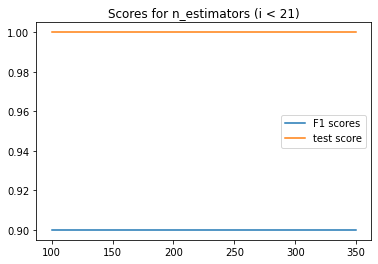

In [41]:
plt.plot(estimators1, f1_lst_e1, label='F1 scores')
plt.plot(estimators1, test_score_e1, label='test score')
plt.title('Scores for n_estimators (i < 21)')
plt.legend()
plt.show()

In [42]:
depths1, f1_lst_depth1, train_score_depth1, test_score_depth1 = depth_params(X_drop_small_copy, Y_drop_small, 2, 31, 120)

/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


2 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


3 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


4 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


5 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


6 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


7 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


8 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


9 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


10 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


11 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


12 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


13 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


14 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


15 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


16 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


17 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


18 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


19 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


20 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


21 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


22 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


23 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


24 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


25 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


26 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


27 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


28 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


29 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


30 1.0 1.0 0.9


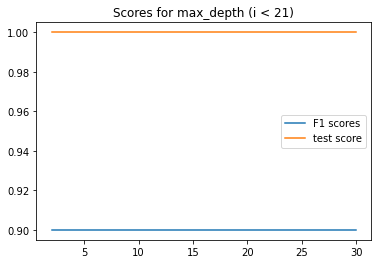

In [43]:
plt.plot(depths1, f1_lst_depth1, label='F1 scores')
plt.plot(depths1, test_score_depth1, label='test score')
plt.title('Scores for max_depth (i < 21)')
plt.legend()
plt.show()

In [45]:
df_depth1 = pd.DataFrame({'max_depth': depths1, 'F1 score': f1_lst_depth1})
df_depth1 = df_depth1.sort_values(by='F1 score', ascending=False)
print(df_depth1.head(10))

    max_depth  F1 score
0           2       0.9
15         17       0.9
27         29       0.9
26         28       0.9
25         27       0.9
24         26       0.9
23         25       0.9
22         24       0.9
21         23       0.9
20         22       0.9


In [51]:
leaves1, f1_lst_leaf1, train_score_leaf1, test_score_leaf1 = leaves_params(X_drop_small_copy, Y_drop_small, 2, 31, depth=17, n=110, step=1)

/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


2 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


3 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


4 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


5 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


6 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


7 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


8 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


9 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


10 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


11 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


12 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


13 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


14 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


15 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


16 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


17 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


18 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


19 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


20 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


21 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


22 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


23 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


24 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


25 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


26 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


27 0.9999944570700073 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


28 0.9999556565600576 0.9999500998003992 0.8923076923076924


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


29 0.9998558838201873 0.9996506986027944 0.8


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


30 0.9998392541084357 0.9996007984031936 0.78


In [52]:
df_leaf1 = pd.DataFrame({'min_samples_leaf': leaves1, 'F1 score': f1_lst_leaf1})
df_leaf1 = df_leaf1.sort_values(by='F1 score', ascending=False)
print(df_leaf1.head(10))

    min_samples_leaf  F1 score
0                  2       0.9
1                  3       0.9
25                27       0.9
24                26       0.9
23                25       0.9
22                24       0.9
21                23       0.9
20                22       0.9
19                21       0.9
18                20       0.9


In [53]:
splits1, f1_lst_split1, train_score_split1, test_score_split1 = split_params(X_drop_small_copy, Y_drop_small, 2, 31, n=120, depth=17, leaf=3, step=1)

/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


2 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


3 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


4 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


5 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


6 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


7 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


8 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


9 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


10 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


11 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


12 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


13 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


14 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


15 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


16 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


17 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


18 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


19 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


20 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


21 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


22 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


23 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


24 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


25 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


26 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


27 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


28 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


29 1.0 1.0 0.9


/data0/sw/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1492: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(


30 1.0 1.0 0.9


In [37]:
# training using GridSearch
X_train1, X_test1, y_train1, y_test1 = train_test_split(X_drop_small_copy, Y_drop_small, train_size=0.7, test_size=0.3, shuffle=True, random_state=42)

model_params1 = {'n_estimators': [100, 110, 320, 300, 200, 170, 180, 340, 320, 240],
                'max_features': ['auto', 'sqrt', 'log2'],
                'min_samples_split': [2, 10, 3, 14, 12, 11, 13, 9, 8, 7],
                'min_samples_leaf': [7, 3, 5, 4, 6, 2, 9, 8, 11, 10],
                'max_depth': [12, 11, 7, 8, 6, 10, 9, 5]} # try to constrain the max_depth in [5, 15] https://stats.stackexchange.com/questions/111968/random-forest-how-to-handle-overfitting

# class_weight? like certain color ratios are more important than others?
# oob_score = True

clf1 = RandomForestClassifier(random_state=42)

rf1 = RandomizedSearchCV(estimator = clf1, param_distributions = model_params1, n_iter = 100, cv = 5, scoring='f1_macro', refit= 'f1_macro', verbose=1, random_state=42, n_jobs = -1)

rf1.fit(X_drop_small_copy, Y_drop_small)

print('best params:\n ')
print(rf1.best_params_)

print('best score: \n ')
print(rf1.best_score_)

Fitting 5 folds for each of 100 candidates, totalling 500 fits
best params:
 
{'n_estimators': 200, 'min_samples_split': 11, 'min_samples_leaf': 9, 'max_features': 'log2', 'max_depth': 5}
best score: 
 
1.0


{'n_estimators': 200, 'min_samples_split': 11, 'min_samples_leaf': 9, 'max_features': 'log2', 'max_depth': 5}

21 < i < 24

In [54]:
X_drop_between_copy = X_drop_between_copy.to_numpy()
Y_drop_between = np.array(Y_drop_between, dtype=int)

In [55]:
estimators2, f1_lst_e2, train_score_e2, test_score_e2 = estimator_params(X_drop_between_copy, Y_drop_between, 100, 360, step=10)

100 1.0 0.9943175030457004 0.9924790370056987
110 1.0 0.9942287719010687 0.9923635700988201
120 1.0 0.9943175818477827 0.9924853624715351
130 1.0 0.9944063129924146 0.9925937812083745
140 1.0 0.9944950441370463 0.9927145033035748
150 1.0 0.9944948865328817 0.9926982642022415
160 1.0 0.9944949653349638 0.992704450570972
170 1.0 0.9946725064263097 0.9929372710259724
180 1.0 0.9946724276242275 0.9929297512201721
190 1.0 0.9947613163730239 0.9930602071826347
200 1.0 0.9945837752816781 0.9928232408465492
210 1.0 0.9945837752816781 0.9928220293384407
220 1.0 0.9945837752816781 0.9928220293384407
230 1.0 0.9947613951751061 0.9930624422987968
240 1.0 0.9944950441370463 0.9927010040699094
250 1.0 0.9945837752816781 0.9928196086463646
260 1.0 0.9947613163730239 0.9930525018009206
270 1.0 0.9947613163730239 0.9930525018009206
280 1.0 0.9948500475176555 0.9931696271005247
290 1.0 0.9946725064263099 0.992929315852448
300 1.0 0.9946725064263099 0.9929371578669777
310 1.0 0.9944951229391286 0.9927089

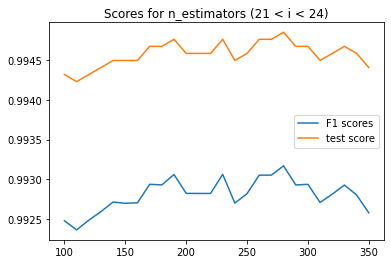

In [56]:
plt.plot(estimators2, f1_lst_e2, label='F1 scores')
plt.plot(estimators2, test_score_e2, label='test score')
plt.title('Scores for n_estimators (21 < i < 24)')
plt.legend()
plt.show()

In [57]:
df_e2 = pd.DataFrame({'n_estimator': estimators2, 'F1 score': f1_lst_e2})
df_e2 = df_e2.sort_values(by='F1 score', ascending=False)
print(df_e2.head(10))

    n_estimator  F1 score
0           100       0.9
1           110       0.9
24          340       0.9
23          330       0.9
22          320       0.9
21          310       0.9
20          300       0.9
19          290       0.9
18          280       0.9
17          270       0.9


In [58]:
depths2, f1_lst_depth2, train_score_depth2, test_score_depth2 = depth_params(X_drop_between_copy, Y_drop_between, 2, 31, 110)

2 0.9645052150183371 0.9624444248314816 0.9482554505122296
3 0.9795988719343729 0.9769161120313443 0.9687520352427121
4 0.9880532959309862 0.9857941910257038 0.9810518081575488
5 0.9926307232976104 0.988723816038115 0.9849696528047627
6 0.9951857938118339 0.9905885885128629 0.9874942223623211
7 0.9971489635015287 0.9927191604110946 0.9903300780663769
8 0.9982834623043935 0.9932522564976258 0.9910437034894743
9 0.9989444268221497 0.9932519412892965 0.9910226329533188
10 0.9992798434532929 0.9934294823806423 0.9912587778070883
11 0.9994968740800363 0.9936960698249491 0.9916297855716346
12 0.9996251229894719 0.9951163197536331 0.9935054337133886
13 0.9997829664535093 0.9946728216346388 0.992951131363322
14 0.9998520233339943 0.994050994403476 0.9921045087226453
15 0.9998914837133792 0.9948502051218201 0.9931699045123314
16 0.9999605386473661 0.9945839328858426 0.9928326091314261
17 0.9999901351484659 0.9943175030457004 0.9924642147991658
18 1.0 0.9944063917944967 0.9926010180853252
19 1.0

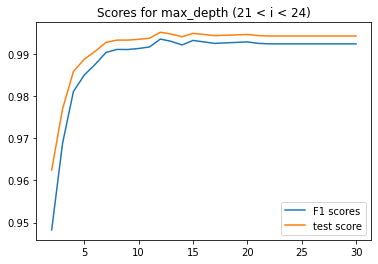

In [59]:
plt.plot(depths2, f1_lst_depth2, label='F1 scores')
plt.plot(depths2, test_score_depth2, label='test score')
plt.title('Scores for max_depth (21 < i < 24)')
plt.legend()
plt.show()

In [60]:
df_depth2 = pd.DataFrame({'max_depth': depths2, 'F1 score': f1_lst_depth2})
df_depth2 = df_depth2.sort_values(by='F1 score', ascending=False)
print(df_depth2.head(10))

    max_depth  F1 score
10         12  0.993505
13         15  0.993170
11         13  0.992951
14         16  0.992833
18         20  0.992822
17         19  0.992707
16         18  0.992601
19         21  0.992478
15         17  0.992464
22         24  0.992364


In [61]:
leaves2, f1_lst_leaf2, train_score_leaf2, test_score_leaf2 = leaves_params(X_drop_between_copy, Y_drop_between, 2, 31, depth=12, n=110, step=1)

2 0.9993982275111944 0.9940512308097229 0.9921096657394557
3 0.9991713310596679 0.9947615527792706 0.9930699468078095
4 0.9989937539995666 0.9939623420609266 0.9919938999543895
5 0.998786588224357 0.9938736109162948 0.9918940879606437
6 0.9986090111642557 0.9930744001979509 0.9908195606225467
7 0.9985005007171287 0.9936959122207846 0.9916451906485134
8 0.9982045454386196 0.9929859842616482 0.9907063905074656
9 0.9980269664320203 0.993518449931521 0.9913984984432845
10 0.9977507476693219 0.9929855902512369 0.9906891794690769
11 0.9976619562195242 0.9928967803045226 0.9905678684446217
12 0.9973561360894811 0.9925419345280779 0.9901048186047159
13 0.9970404501346548 0.9926308232768744 0.9902355329326016
14 0.9968727437655813 0.9927194756194238 0.9903609589376414
15 0.9966359805160228 0.9923643934367323 0.9898817072365338
16 0.9964386737528536 0.9920978847945079 0.9895247608358156
17 0.9962019182892867 0.9921868523453863 0.9896537975522832
18 0.9961821798269781 0.9923645510408967 0.9898915

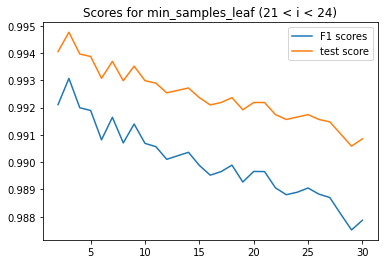

In [63]:
plt.plot(leaves2, f1_lst_leaf2, label='F1 scores')
plt.plot(leaves2, test_score_leaf2, label='test score')
plt.title('Scores for min_samples_leaf (21 < i < 24)')
plt.legend()
plt.show()

In [62]:
df_leaf2 = pd.DataFrame({'min_samples_leaf': leaves2, 'F1 score': f1_lst_leaf2})
df_leaf2 = df_leaf2.sort_values(by='F1 score', ascending=False)
print(df_leaf2.head(10))

   min_samples_leaf  F1 score
1                 3  0.993070
0                 2  0.992110
2                 4  0.991994
3                 5  0.991894
5                 7  0.991645
7                 9  0.991398
4                 6  0.990820
6                 8  0.990706
8                10  0.990689
9                11  0.990568


In [64]:
splits2, f1_lst_split2, train_score_split2, test_score_split2 = split_params(X_drop_between_copy, Y_drop_between, 2, 31, n=110, depth=12, leaf=3, step=1)

2 0.9991713310596679 0.9947615527792706 0.9930699468078095
3 0.9991713310596679 0.9947615527792706 0.9930699468078095
4 0.9991713310596679 0.9947615527792706 0.9930699468078095
5 0.9991713310596679 0.9947615527792706 0.9930699468078095
6 0.9991713310596679 0.9947615527792706 0.9930699468078095
7 0.9991811949379532 0.9943171878373714 0.9924743655442407
8 0.9990430821502324 0.9940510732055584 0.9921158288935237
9 0.9990332153522006 0.9936958334187022 0.9916341445336043
10 0.9989838872015347 0.9938735321142126 0.9918426746067709
11 0.9989246971190819 0.9933406724339285 0.9911438305943834
12 0.9988556402385971 0.9930744790000331 0.9908199538377414
13 0.9988655089831269 0.99369575461662 0.9916362226538213
14 0.9988161818057101 0.9932520200913789 0.9910389247437872
15 0.9987767185065783 0.9936959910228668 0.991631733056473
16 0.9987175264776275 0.9933410664443401 0.9911671360422544
17 0.9986879338695234 0.9932520988934612 0.9910319378140757
18 0.9986977987210575 0.9938733745100482 0.99185339

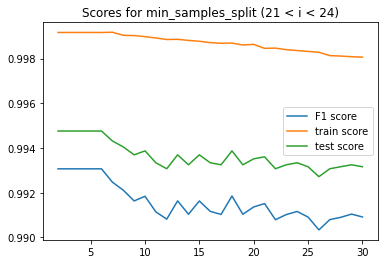

In [65]:
plt.plot(splits2, f1_lst_split2, label='F1 score')
plt.plot(splits2, train_score_split2, label='train score')
plt.plot(splits2, test_score_split2, label='test score')
plt.title('Scores for min_samples_split (21 < i < 24)')
plt.legend()
plt.show()

In [66]:
# get the top 10 min_samples_split with the highest F1 scores
df_split2 = pd.DataFrame({'min_samples_split': splits2, 'F1 score': f1_lst_split2})
df_split2 = df_split2.sort_values(by='F1 score', ascending=False)
print(df_split2.head(10))

    min_samples_split  F1 score
0                   2  0.993070
1                   3  0.993070
2                   4  0.993070
3                   5  0.993070
4                   6  0.993070
5                   7  0.992474
6                   8  0.992116
16                 18  0.991853
8                  10  0.991843
11                 13  0.991636


In [ ]:
# training using GridSearch
X_train2, X_test2, y_train2, y_test2 = train_test_split(X_drop_between_copy, Y_drop_between, train_size=0.7, test_size=0.3, shuffle=True, random_state=42)

model_params2 = {'n_estimators': [230, 260, 270, 190, 180, 170, 150],
                'max_features': ['auto', 'sqrt', 'log2'],
                'min_samples_split': [2, 3, 4, 5, 6, 7, 8],
                'min_samples_leaf': [3, 2, 4, 5, 7, 6],
                'max_depth': [12, 15, 10, 13, 5, 8, 9, 18]} # try to constrain the max_depth in [5, 15] https://stats.stackexchange.com/questions/111968/random-forest-how-to-handle-overfitting

# class_weight? like certain color ratios are more important than others?
# oob_score = True

clf2 = RandomForestClassifier(random_state=42)

rf2 = RandomizedSearchCV(estimator = clf2, param_distributions = model_params2, n_iter = 100, cv = 5, scoring='f1_macro', refit= 'f1_macro', verbose=1, random_state=42, n_jobs = -1)

rf2.fit(X_train2, y_train2)

print('best params:\n ')
print(rf2.best_params_)

print('best score: \n ')
print(rf2.best_score_)

Fitting 5 folds for each of 100 candidates, totalling 500 fits
